# Covid19 Visualization

In [1]:
import pandas as pd
import numpy as np

# viz
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

plt.style.use('fivethirtyeight')
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

Coronavirus Case Data is provided by <a href='https://github.com/CSSEGISandData/COVID-19'>Johns Hopkins University</a>
   <br>Mobility data is provided by <a href='https://www.apple.com/covid19/mobility'>Apple</a>
   <br>Learn more from the <a href='https://www.who.int/emergencies/diseases/novel-coronavirus-2019'>World Health Organization</a>
   <br>Learn more from the <a href='https://www.cdc.gov/coronavirus/2019-ncov'>Centers for Disease Control and Prevention</a>
   <br>Check out map visualizations from  <a href='https://gisanddata.maps.arcgis.com/apps/opsdashboard/index.html#/bda7594740fd40299423467b48e9ecf6'>JHU CCSE Dashboard</a>
   
   
   <font face = "Verdana" size ="3"> To do list </font>
* <a href='#world_wide_graphs'>Exploring Global Coronavirus Cases</a>
* <a href='#country_graphs'>Exploring Coronavirus Cases From Different Countries</a>
* <a href='#prediction'>Worldwide Confirmed Cases Prediction</a>
* <a href='#data_table'>Data Table</a>
* <a href='#pie_charts'>Pie Charts</a>
* <a href='#bar_charts'>Bar Charts</a>
* <a href='#hospital_testing'>US Testing Data</a>
* <a href='#mobility_data'>Mobility Data for Hotspots</a>
* <a href='#prediction'>Perdict</a>
* <a href='#gviz'>Geographical visualization</a>

# Import the data

In [2]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/01-08-2021.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/01-08-2021.csv')
apple_mobility = pd.read_csv('https://covid19-static.cdn-apple.com/covid19-mobility-data/2024HotfixDev9/v3/en-us/applemobilitytrends-2021-01-08.csv')

In [3]:
confirmed_df.head(10)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,51526,51526,51526,53011,53105,53105,53207,53332,53400,53489
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,58316,58991,59438,59623,60283,61008,61705,62378,63033,63595
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,99897,100159,100408,100645,100873,101120,101382,101657,101913,102144
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,8117,8166,8192,8249,8308,8348,8348,8489,8586,8586
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,17568,17608,17642,17684,17756,17864,17974,18066,18156,18193
5,NaN,Antigua and Barbuda,17.06080,-61.796400,0,0,0,0,0,0,...,159,159,160,160,160,163,163,167,169,176
6,NaN,Argentina,-38.41610,-63.616700,0,0,0,0,0,0,...,1629594,1634834,1640718,1648940,1662730,1676171,1690006,1703352,1714409,1722217
7,NaN,Armenia,40.06910,45.038200,0,0,0,0,0,0,...,159738,159798,160027,160220,160544,160853,161054,161415,161794,162131
8,Australian Capital Territory,Australia,-35.47350,149.012400,0,0,0,0,0,0,...,118,118,118,118,118,118,118,118,118,118
9,New South Wales,Australia,-33.86880,151.209300,0,0,0,0,3,4,...,4947,4958,4965,4973,4978,4984,4995,5001,5007,5018


In [4]:
confirmed_df.tail(10)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21
262,NaN,United Kingdom,55.378100,-3.436000,0,0,0,0,0,0,...,2542065,2599789,2654779,2713563,2774479,2836801,2889419,2957472,3017409,3072349
263,NaN,Uruguay,-32.522800,-55.765800,0,0,0,0,0,0,...,19753,20275,20823,21426,22104,23048,23807,24339,24974,26186
264,NaN,Uzbekistan,41.377491,64.585262,0,0,0,0,0,0,...,77182,77182,77258,77258,77295,77350,77412,77485,77530,77572
265,NaN,Vanuatu,-15.376700,166.959200,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
266,NaN,Venezuela,6.423800,-66.589700,0,0,0,0,0,0,...,113884,114083,114230,114407,114662,114908,115322,115667,116172,116610
267,NaN,Vietnam,14.058324,108.277199,0,2,2,2,2,2,...,1474,1482,1494,1497,1504,1505,1509,1512,1513,1514
268,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,139223,140287,141219,142228,143169,144257,145252,146074,146701,147400
269,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,2101,2101,2101,2101,2101,2102,2104,2104,2104,2104
270,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,20997,21230,21582,21993,22645,23495,24297,25326,26567,27728
271,NaN,Zimbabwe,-19.015438,29.154857,0,0,0,0,0,0,...,14084,14491,15265,15829,17194,17804,18675,19660,20499,21477


In [5]:
confirmed_df.shape

(272, 359)

In [6]:
confirmed_df.describe()

,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,...,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21
count,271.000000,271.000000,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,272.000000,...,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02
mean,20.688275,22.695528,2.040441,2.404412,3.459559,5.272059,7.786765,10.761029,20.507353,22.672794,...,3.088947e+05,3.112042e+05,3.131696e+05,3.151774e+05,3.178833e+05,3.207434e+05,3.239128e+05,3.269338e+05,3.297462e+05,3.319188e+05
std,25.215172,73.423431,26.977273,27.075507,33.707640,46.913592,65.561712,88.334350,216.769692,218.096460,...,1.496748e+06,1.513619e+06,1.525497e+06,1.535906e+06,1.549935e+06,1.565140e+06,1.582286e+06,1.599133e+06,1.615396e+06,1.628017e+06
min,-51.796300,-178.116500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.787974,-21.031300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,7.062500e+02,7.115000e+02,7.150000e+02,7.285000e+02,7.285000e+02,7.520000e+02,7.610000e+02,7.777500e+02,8.095000e+02,8.125000e+02
50%,21.916200,20.939400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,8.962500e+03,8.980000e+03,9.000500e+03,9.027000e+03,9.224500e+03,9.377000e+03,9.433000e+03,9.531000e+03,9.577500e+03,9.662000e+03
75%,41.133100,82.510898,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.259982e+05,1.264288e+05,1.271098e+05,1.275972e+05,1.287210e+05,1.303470e+05,1.311888e+05,1.360702e+05,1.390702e+05,1.402715e+05
max,71.706900,178.065000,444.000000,444.000000,549.000000,761.000000,1058.000000,1423.000000,3554.000000,3554.000000,...,2.018424e+07,2.048674e+07,2.069664e+07,2.087323e+07,2.110437e+07,2.135475e+07,2.163549e+07,2.192801e+07,2.219284e+07,2.240913e+07


# Data Processing and Exploring

In [7]:
cols = confirmed_df.keys()

In [8]:
confirmed = confirmed_df.loc[:,cols[4]:cols[-1]]

In [9]:
confirmed.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21
0,0,0,0,0,0,0,0,0,0,0,...,51526,51526,51526,53011,53105,53105,53207,53332,53400,53489
1,0,0,0,0,0,0,0,0,0,0,...,58316,58991,59438,59623,60283,61008,61705,62378,63033,63595
2,0,0,0,0,0,0,0,0,0,0,...,99897,100159,100408,100645,100873,101120,101382,101657,101913,102144
3,0,0,0,0,0,0,0,0,0,0,...,8117,8166,8192,8249,8308,8348,8348,8489,8586,8586
4,0,0,0,0,0,0,0,0,0,0,...,17568,17608,17642,17684,17756,17864,17974,18066,18156,18193


In [10]:
confiremd_iloc=confirmed_df.iloc[:,4:]
confiremd_iloc.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21
0,0,0,0,0,0,0,0,0,0,0,...,51526,51526,51526,53011,53105,53105,53207,53332,53400,53489
1,0,0,0,0,0,0,0,0,0,0,...,58316,58991,59438,59623,60283,61008,61705,62378,63033,63595
2,0,0,0,0,0,0,0,0,0,0,...,99897,100159,100408,100645,100873,101120,101382,101657,101913,102144
3,0,0,0,0,0,0,0,0,0,0,...,8117,8166,8192,8249,8308,8348,8348,8489,8586,8586
4,0,0,0,0,0,0,0,0,0,0,...,17568,17608,17642,17684,17756,17864,17974,18066,18156,18193


In [11]:
deaths = deaths_df.loc[:,cols[4]:cols[-1]]
recoveries = recoveries_df.loc[:,cols[4]:cols[-1]]

In [12]:
dates = confirmed.keys()

world_cases = []
total_deaths =[]
total_recovered = []
total_active = []

mortality_rate = []
recovery_rate = []

for i in dates:
    confirmed_sum = confirmed[i].sum()
    death_sum = deaths[i].sum()
    recovered_sum = recoveries[i].sum()
    
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    total_recovered.append(recovered_sum)
    
    total_active.append(confirmed_sum-death_sum-recovered_sum)
    
    
    mortality_rate.append(death_sum/confirmed_sum)
    recovery_rate.append(recovered_sum/confirmed_sum)

In [13]:
def daily_increase(data):
    d=[]
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d

def moving_average(data , window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    
    return moving_average


# window size
window = 7

world_daily_increase = daily_increase(world_cases)
world_confirmed_avg = moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase , window)

world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths , window)
world_daily_death_avg = moving_average(world_daily_death , window)


world_daily_recovery = daily_increase(total_recovered)
world_recovery_avg = moving_average(total_recovered , window)
world_daily_recovery_avg = moving_average (world_daily_recovery , window)

world_active_avg = moving_average(total_active, window)

In [14]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1,1)
wordl_cases = np.array(world_cases).reshape(-1,1)
total_deaths = np.array(total_deaths).reshape(-1,1)
total_recovered = np.array(total_recovered).reshape(-1,1)

In [15]:
days_in_future = 10
future_forcast = np.array([i for i in range(len(dates)+ days_in_future)]).reshape(-1,1)
adjusted_dates = future_forcast[:-10]

In [16]:
import datetime

In [17]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days = i)).strftime('%m/%d/%y'))

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR

In [19]:
X_train_confirmed , X_test_confirmed , y_train_confirmed , y_test_confirmed = train_test_split(days_since_1_22[50:] , world_cases [50:] , test_size = 0.05 
                                                                                               , shuffle = False)

In [20]:
svm_confimed = SVR(shrinking =True , kernel = 'poly' , gamma =0.01 , epsilon =1 ,C= 0.1 , degree =3 )

In [21]:
svm_confimed.fit(X_train_confirmed , y_train_confirmed )

SVR(C=0.1, epsilon=1, gamma=0.01, kernel='poly')

In [22]:
svm_pred = svm_confimed.predict(future_forcast)

In [23]:
svm_test_pred = svm_confimed.predict(X_test_confirmed)

In [24]:
from sklearn.metrics import mean_squared_error , mean_absolute_error

MAE: 612770.9359972998
MSE: 460164222628.38995


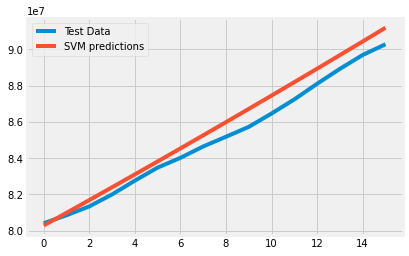

In [25]:
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)

plt.legend(['Test Data' , 'SVM predictions'])
print('MAE:' , mean_absolute_error(svm_test_pred , y_test_confirmed ) )
print('MSE:' , mean_squared_error(svm_test_pred , y_test_confirmed ) )

# Worldwide Overview 

In [26]:
adjusted_dates = adjusted_dates.reshape(1,-1)[0]

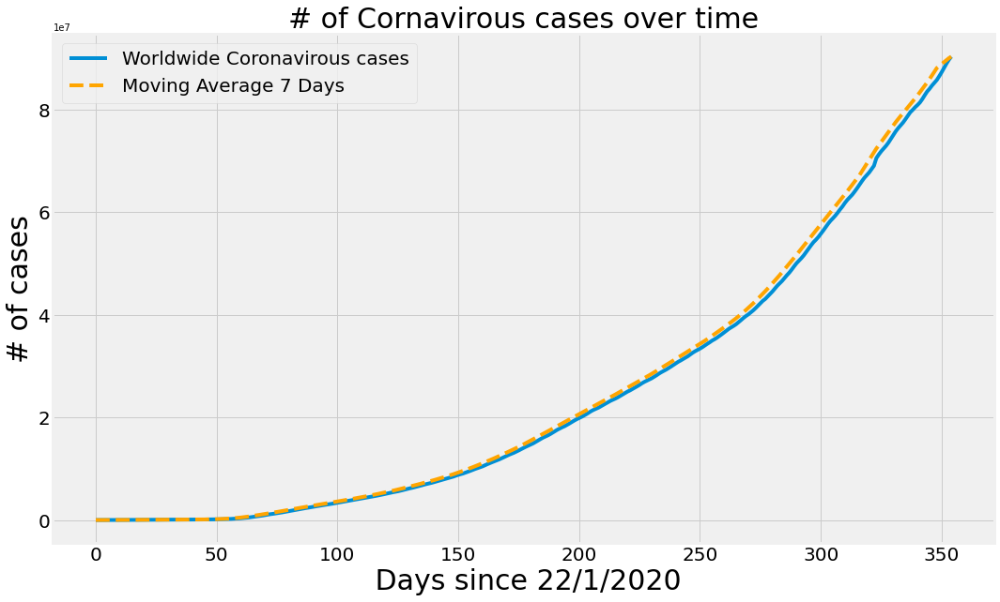

In [27]:
plt.figure(figsize = (16,10))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg , linestyle = 'dashed' , color = 'orange')
plt.title('# of Cornavirous cases over time', size = 30)
plt.xlabel(' Days since 22/1/2020' , size = 30)
plt.ylabel('# of cases' , size = 30)
plt.legend(['Worldwide Coronavirous cases', 'Moving Average {} Days'.format(window)], prop = {'size' : 20})

plt.xticks(size = 20)
plt.yticks(size = 20)

plt.show()

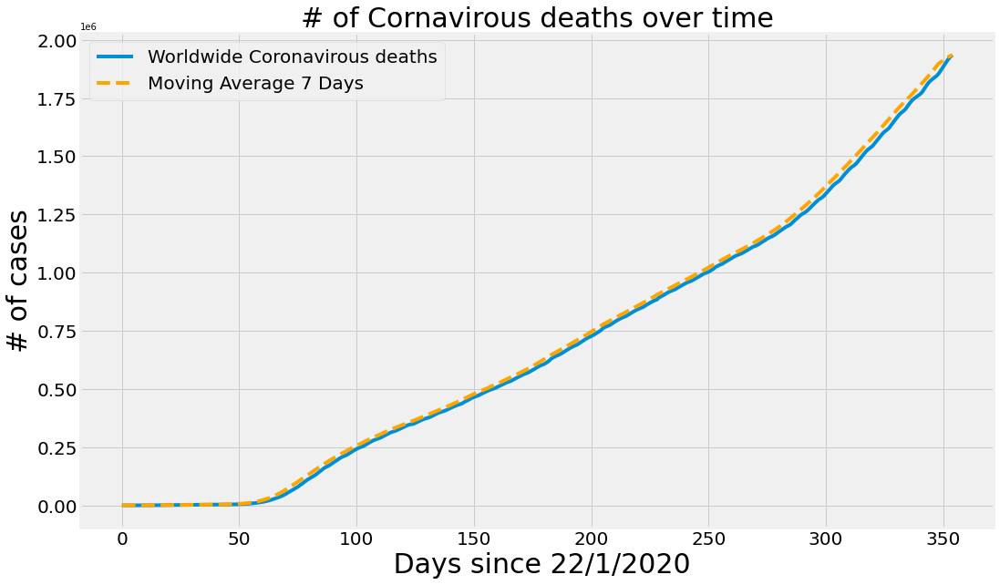

In [28]:
plt.figure(figsize = (16,10))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg , linestyle = 'dashed' , color = 'orange')
plt.title('# of Cornavirous deaths over time', size = 30)
plt.xlabel(' Days since 22/1/2020' , size = 30)
plt.ylabel('# of cases' , size = 30)
plt.legend(['Worldwide Coronavirous deaths', 'Moving Average {} Days'.format(window)], prop = {'size' : 20})

plt.xticks(size = 20)
plt.yticks(size = 20)

plt.show()

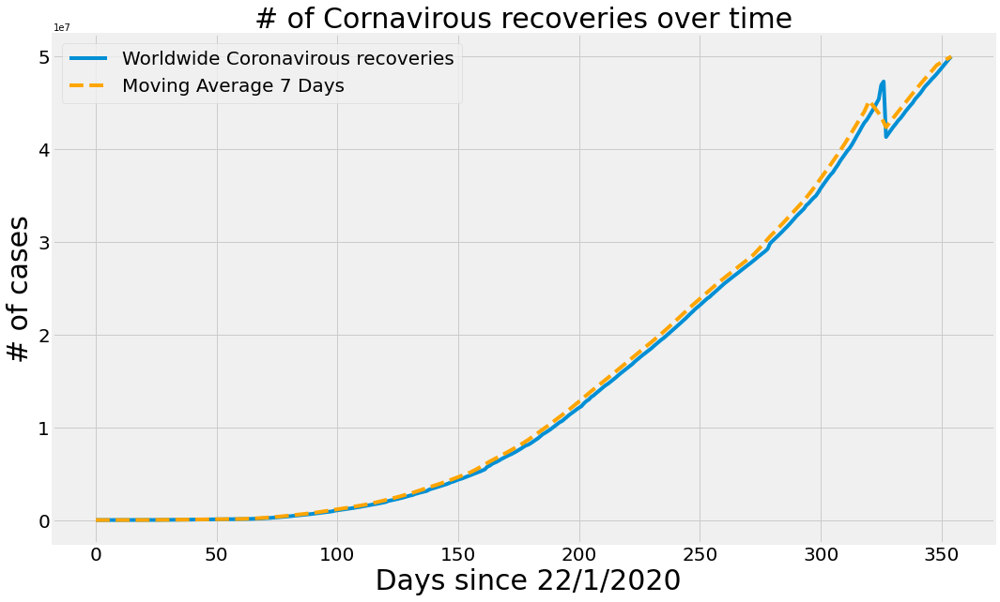

In [29]:
plt.figure(figsize = (16,10))
plt.plot(adjusted_dates, total_recovered)
plt.plot(adjusted_dates, world_recovery_avg , linestyle = 'dashed' , color = 'orange')
plt.title('# of Cornavirous recoveries over time', size = 30)
plt.xlabel(' Days since 22/1/2020' , size = 30)
plt.ylabel('# of cases' , size = 30)
plt.legend(['Worldwide Coronavirous recoveries', 'Moving Average {} Days'.format(window)], prop = {'size' : 20})

plt.xticks(size = 20)
plt.yticks(size = 20)

plt.show()

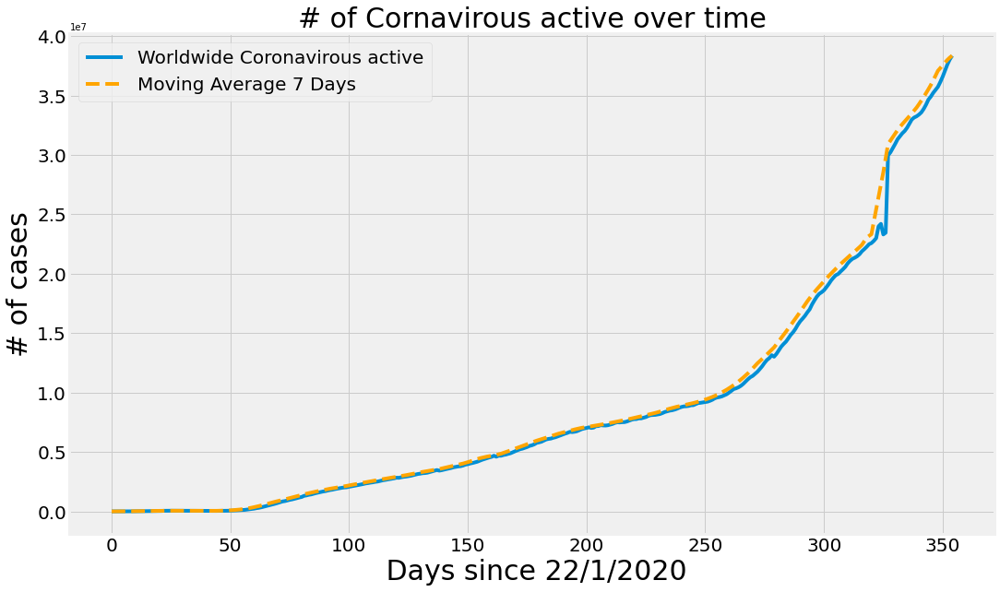

In [30]:
plt.figure(figsize = (16,10))
plt.plot(adjusted_dates, total_active)
plt.plot(adjusted_dates, world_active_avg , linestyle = 'dashed' , color = 'orange')
plt.title('# of Cornavirous active over time', size = 30)
plt.xlabel(' Days since 22/1/2020' , size = 30)
plt.ylabel('# of cases' , size = 30)
plt.legend(['Worldwide Coronavirous active', 'Moving Average {} Days'.format(window)], prop = {'size' : 20})

plt.xticks(size = 20)
plt.yticks(size = 20)

plt.show()

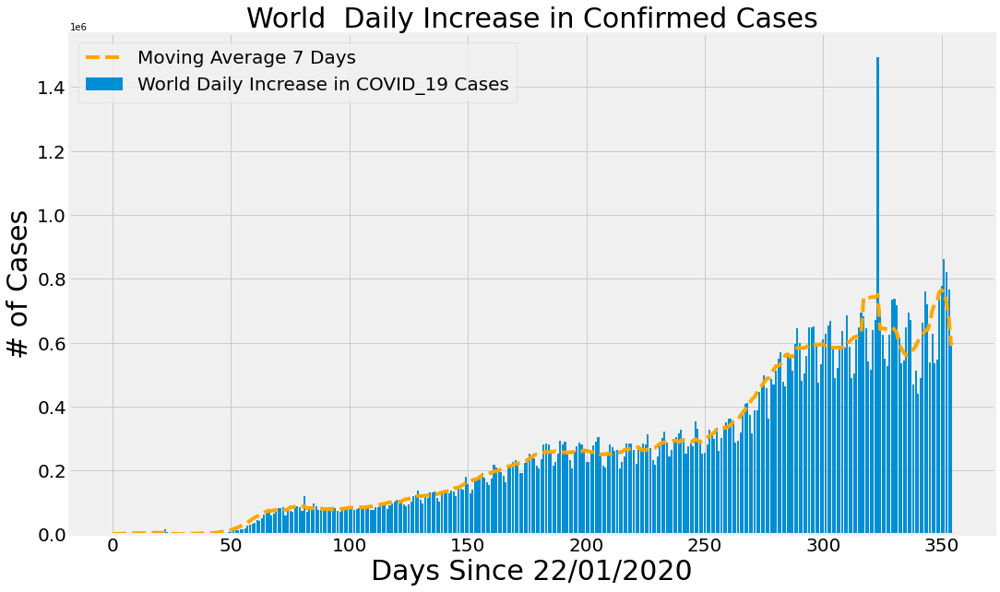

In [31]:
plt.figure(figsize=(16,10))
plt.bar(adjusted_dates ,world_daily_increase)
plt.plot(adjusted_dates , world_daily_increase_avg , color = 'orange', linestyle = 'dashed')

plt.title('World  Daily Increase in Confirmed Cases' , size = 30)
plt.xlabel('Days Since 22/01/2020' , size = 30)
plt.ylabel('# of Cases' , size = 30)
plt.legend(['Moving Average {} Days'.format(window) , 'World Daily Increase in COVID_19 Cases'] , prop = {'size' : 20})

plt.xticks(size = 20)
plt.yticks(size = 20)

plt.show()

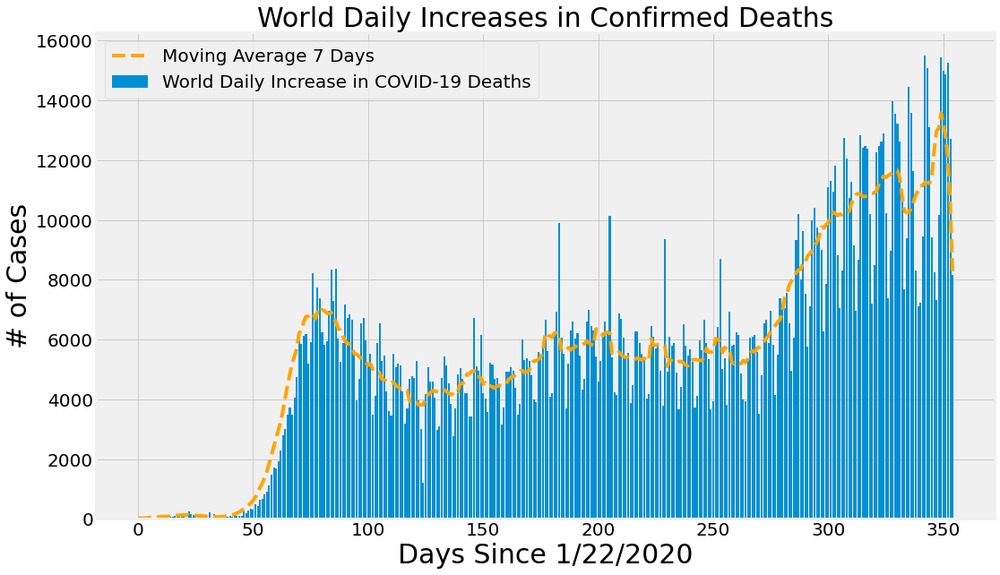

In [32]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)

plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})

plt.xticks(size=20)
plt.yticks(size=20)

plt.show()

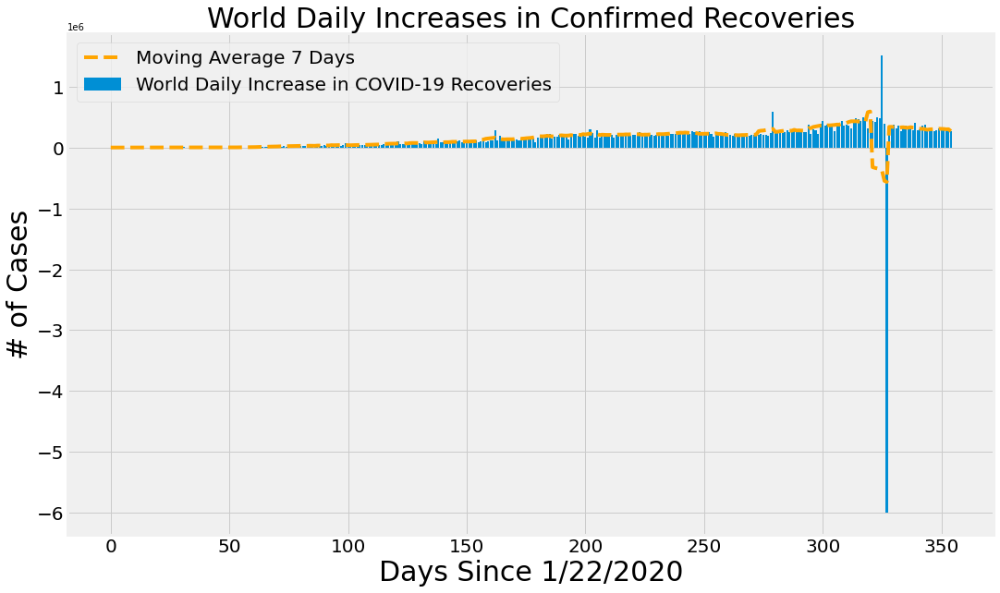

In [33]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_recovery)
plt.plot(adjusted_dates, world_daily_recovery_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Recoveries', size=30)

plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Recoveries'], prop={'size': 20})

plt.xticks(size=20)
plt.yticks(size=20)

plt.show()

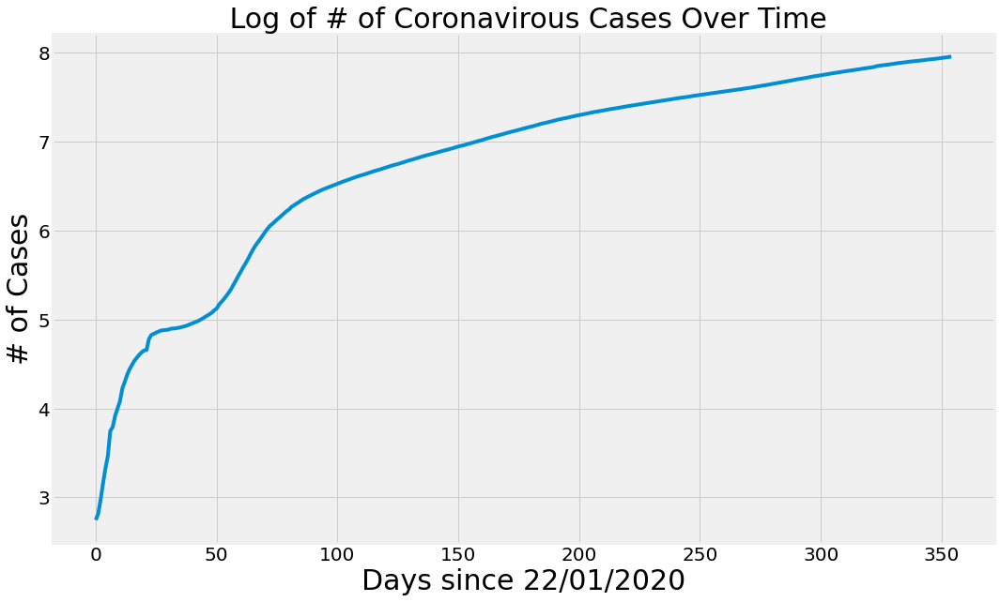

In [34]:
plt.figure(figsize=(16,10))
plt.plot(adjusted_dates , np.log10(world_cases))
plt.title(' Log of # of Coronavirous Cases Over Time' , size = 30)
plt.xlabel('Days since 22/01/2020' , size = 30)
plt.ylabel('# of Cases' , size = 30)

plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

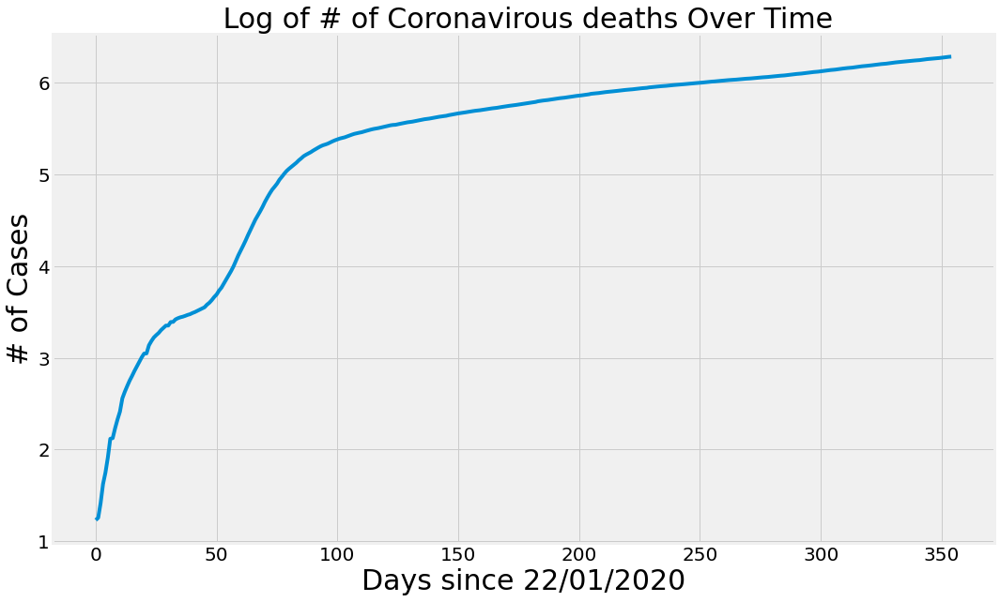

In [35]:
plt.figure(figsize=(16,10))
plt.plot(adjusted_dates , np.log10(total_deaths))
plt.title(' Log of # of Coronavirous deaths Over Time' , size = 30)
plt.xlabel('Days since 22/01/2020' , size = 30)
plt.ylabel('# of Cases' , size = 30)

plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

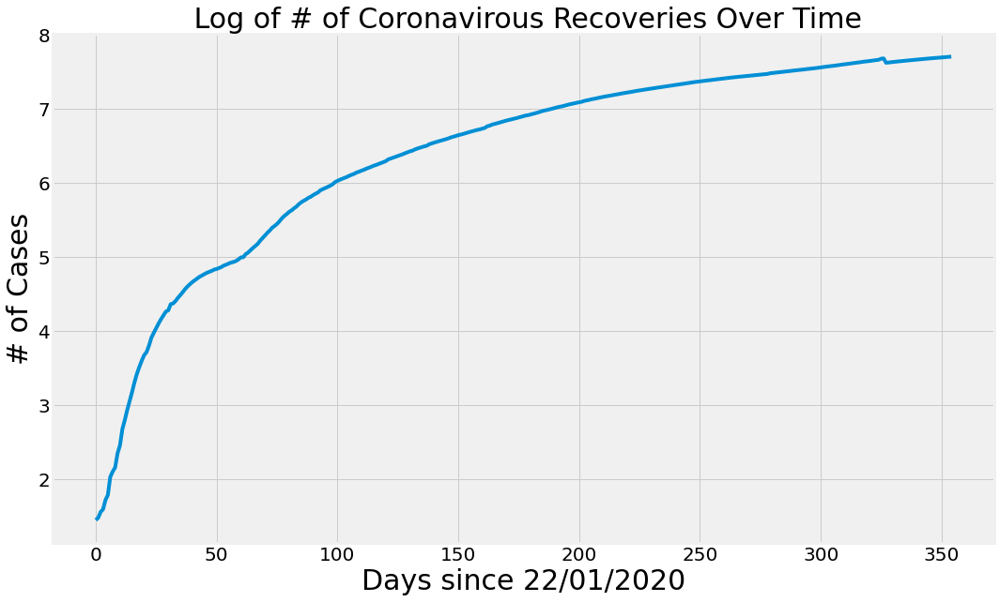

In [36]:
plt.figure(figsize=(16,10))
plt.plot(adjusted_dates , np.log10(total_recovered))
plt.title(' Log of # of Coronavirous Recoveries Over Time' , size = 30)
plt.xlabel('Days since 22/01/2020' , size = 30)
plt.ylabel('# of Cases' , size = 30)

plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

# Country Specific Graph

In [37]:
def country_plot(x, y1, y2, y3, y4, country):
    # window is set as 14 in in the beginning of the notebook 
    confirmed_avg = moving_average(y1, window)
    confirmed_increase_avg = moving_average(y2, window)
    death_increase_avg = moving_average(y3, window)
    recovery_increase_avg = moving_average(y4, window)
    
    plt.figure(figsize=(16, 10))
    plt.plot(x, y1)
    plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
    plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
    plt.title('{} Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y2)
    plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y3)
    plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Deaths'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=(16, 10))
    plt.bar(x, y4)
    plt.plot(x, recovery_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Recoveries'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Recoveries'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
      
# helper function for getting country's cases, deaths, and recoveries        
def get_country_info(country_name):
    country_cases = []
    country_deaths = []
    country_recoveries = []  
    
    for i in dates:
        country_cases.append(confirmed_df[confirmed_df['Country/Region']==country_name][i].sum())
        country_deaths.append(deaths_df[deaths_df['Country/Region']==country_name][i].sum())
        country_recoveries.append(recoveries_df[recoveries_df['Country/Region']==country_name][i].sum())
    return (country_cases, country_deaths, country_recoveries)
    
    
def country_visualizations(country_name):
    country_info = get_country_info(country_name)
    country_cases = country_info[0]
    country_deaths = country_info[1]
    country_recoveries = country_info[2]
    
    country_daily_increase = daily_increase(country_cases)
    country_daily_death = daily_increase(country_deaths)
    country_daily_recovery = daily_increase(country_recoveries)
    
    country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_daily_recovery, country_name)
    

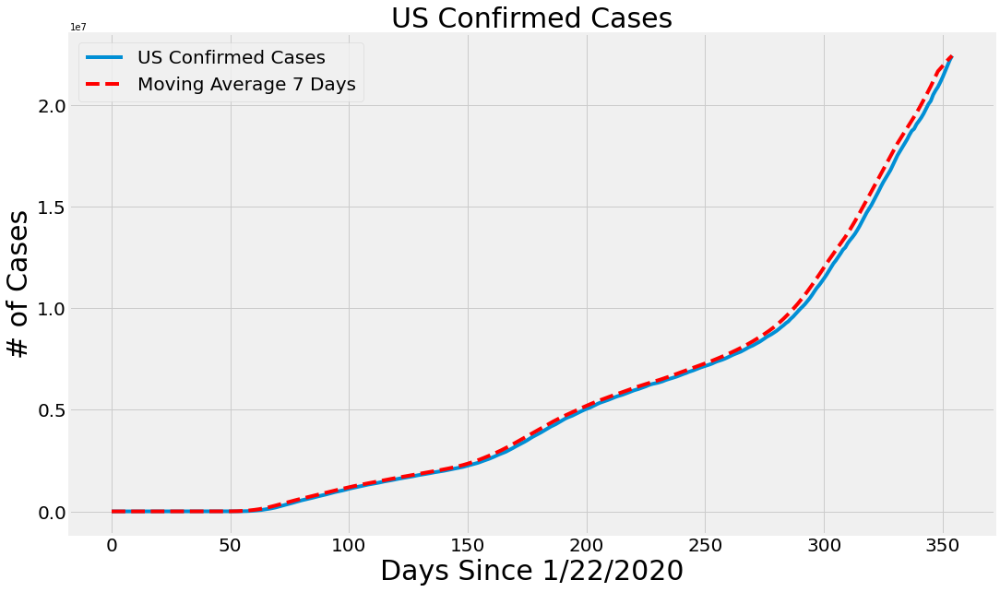

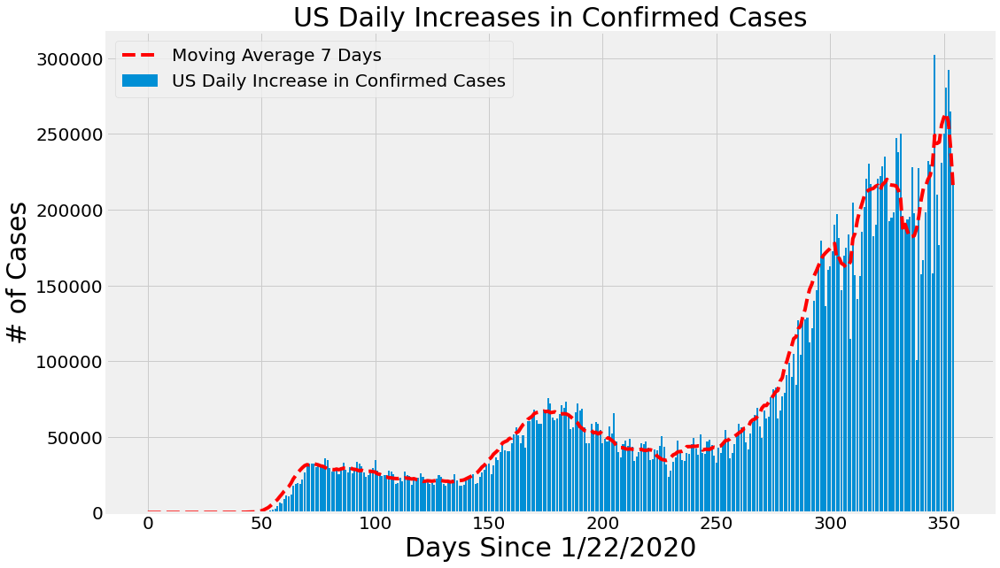

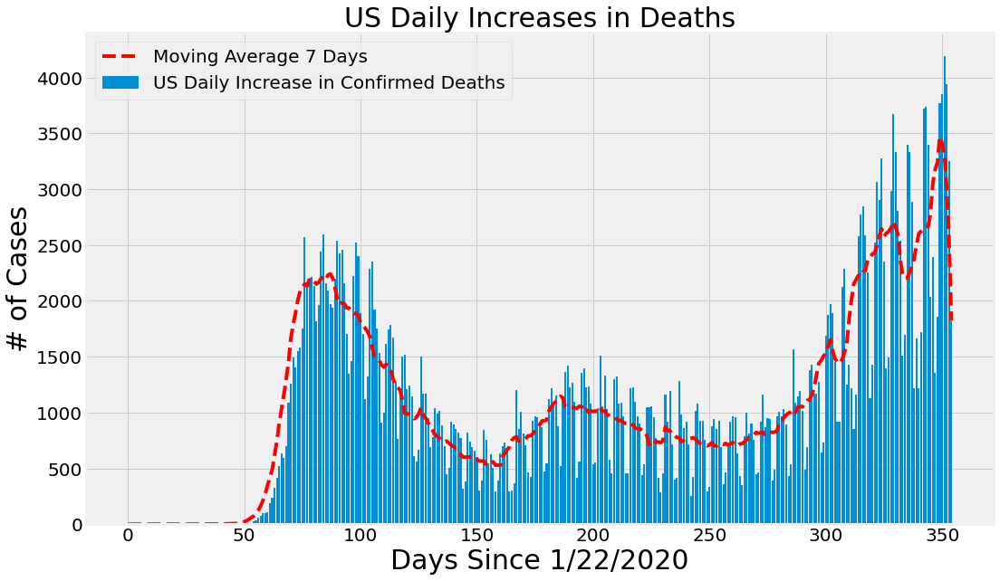

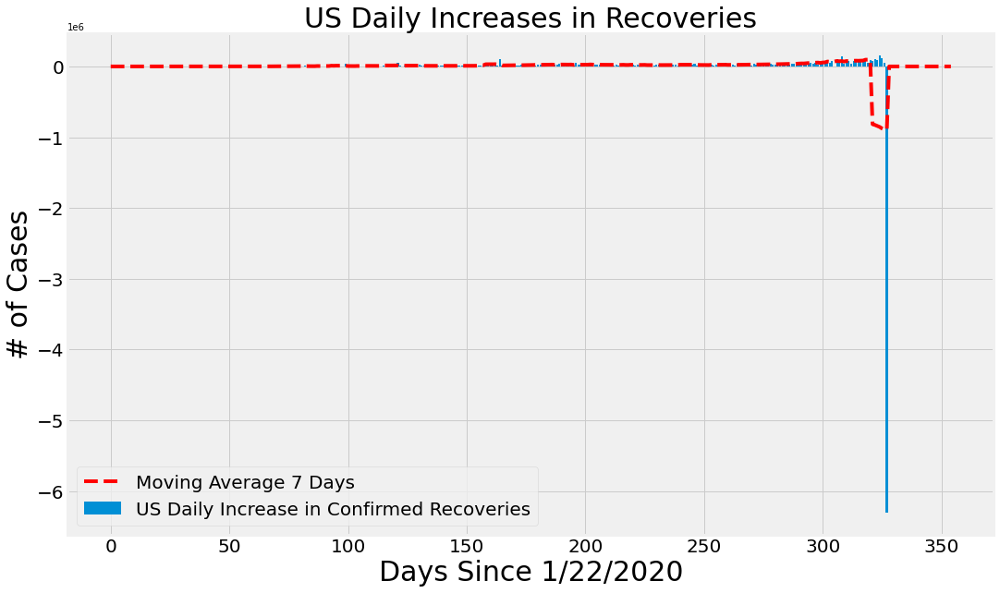

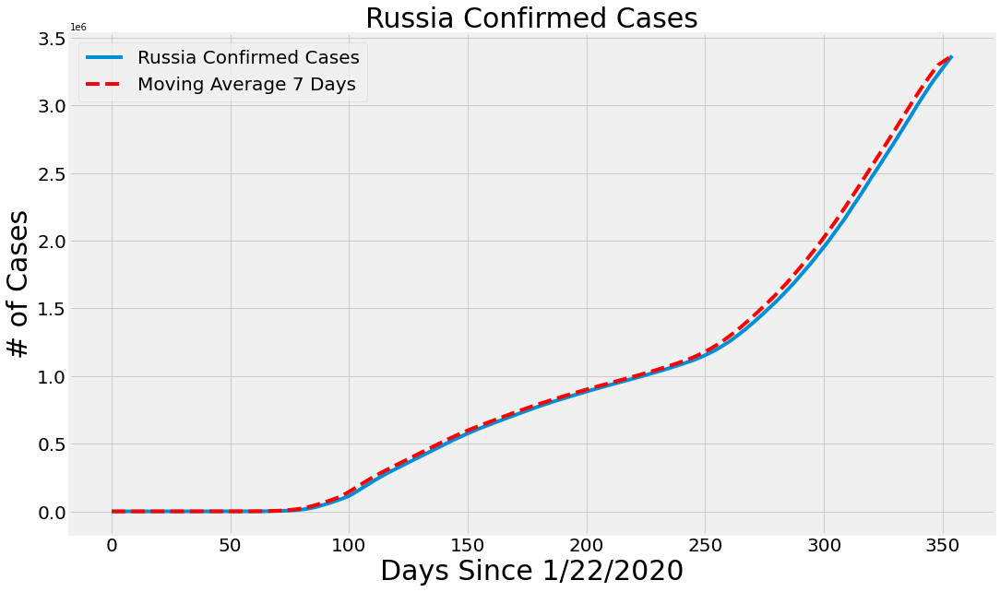

...

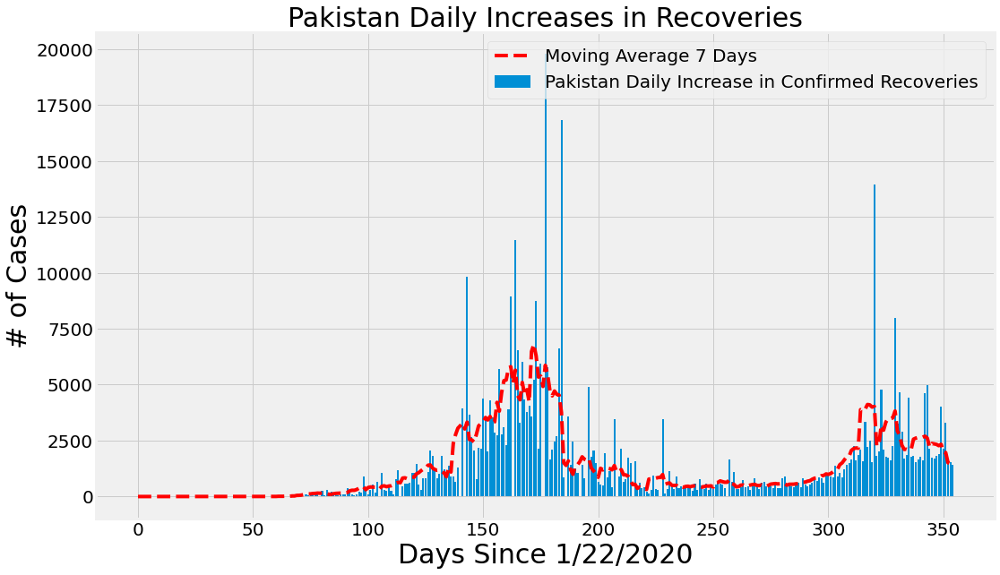

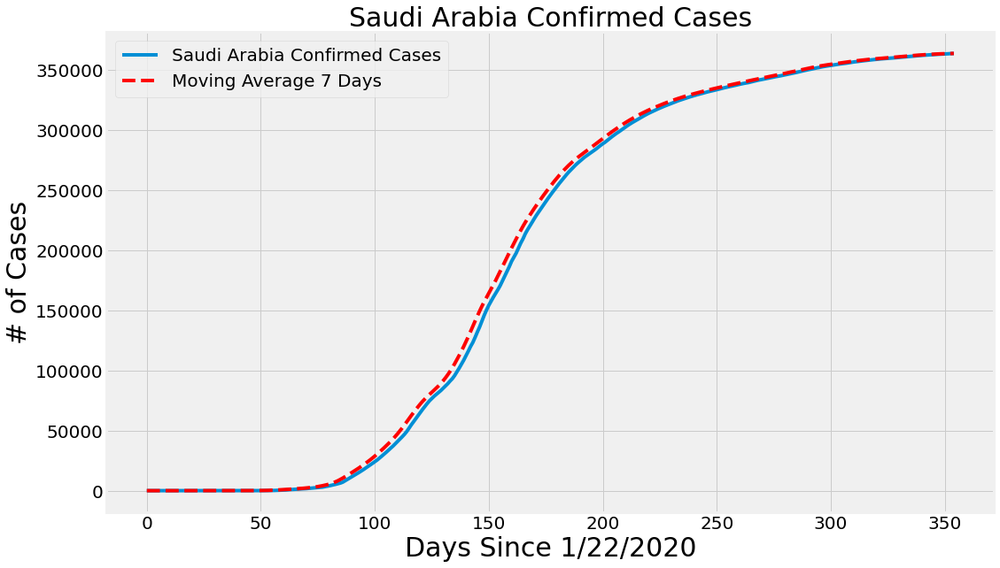

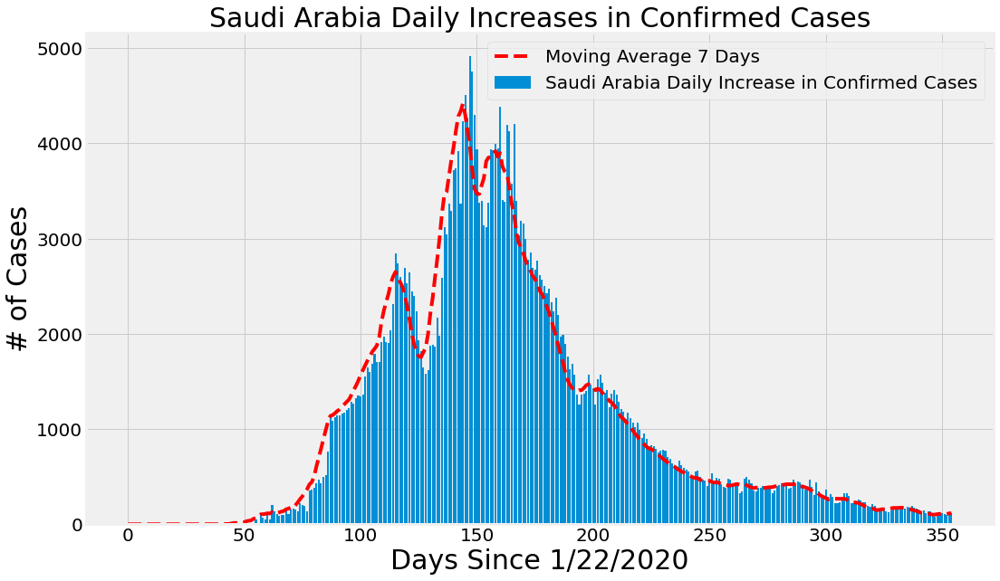

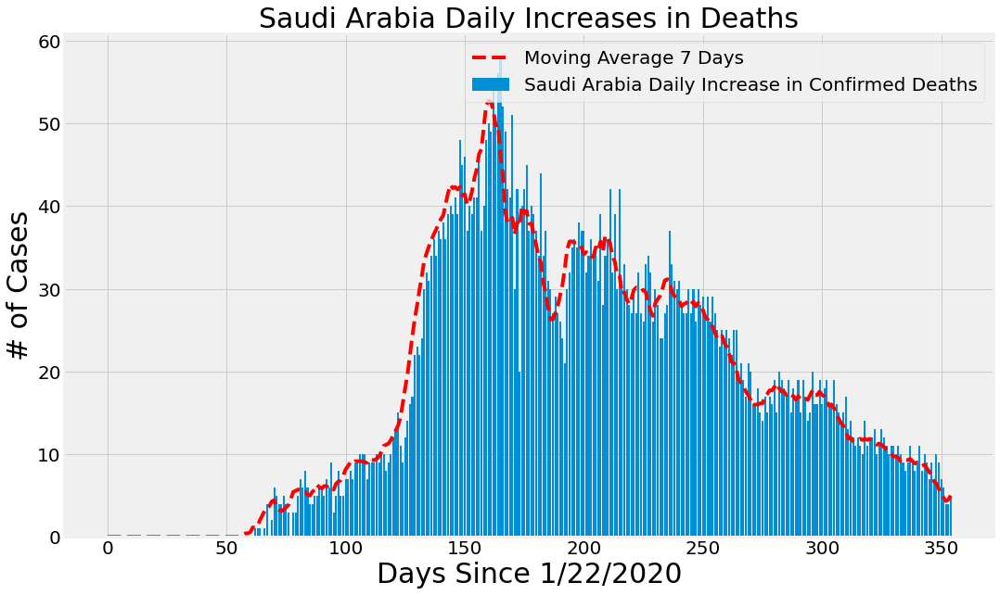

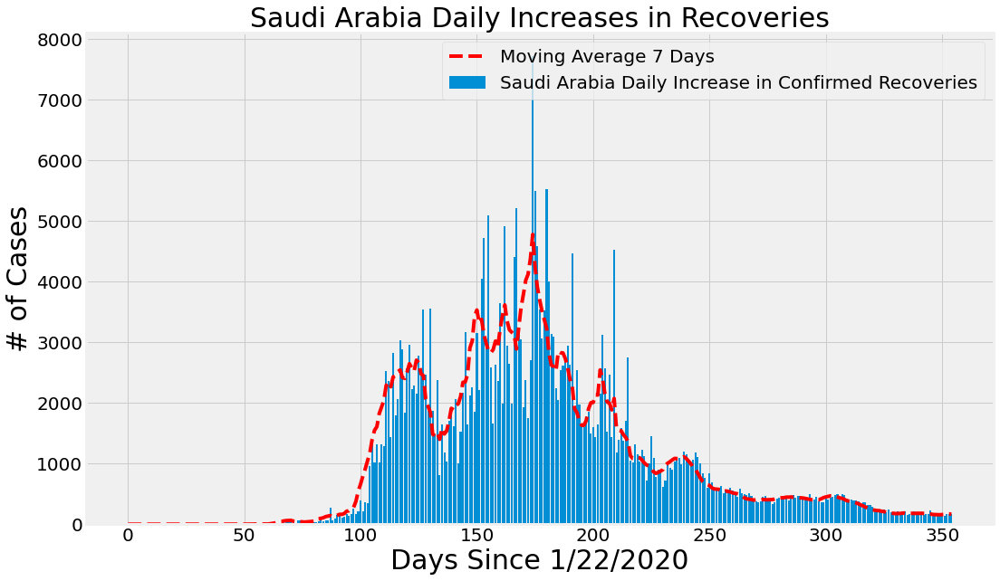

In [38]:
countries = ['US' , 'Russia' , 'India' , 'China', 'Italy' , 'Spain' , 'Germany' , 'France' , 'Iran' , 'Iraq' , 'Turkey' , 'Pakistan' , 'Saudi Arabia']

for country in countries :
    country_visualizations(country)

# Country  Comparison

In [39]:
compare_countries = ['US' , 'China' , 'India' , 'Russia' , 'Germany' , ' Spain' , ' France' , 'United Kingdom' , 'Iran']

In [40]:
graph_name = ['Coronavirous Confirmed cases' , 'Coronavirous confirmed deaths' , 'Coronavirous confirmed recoveries']

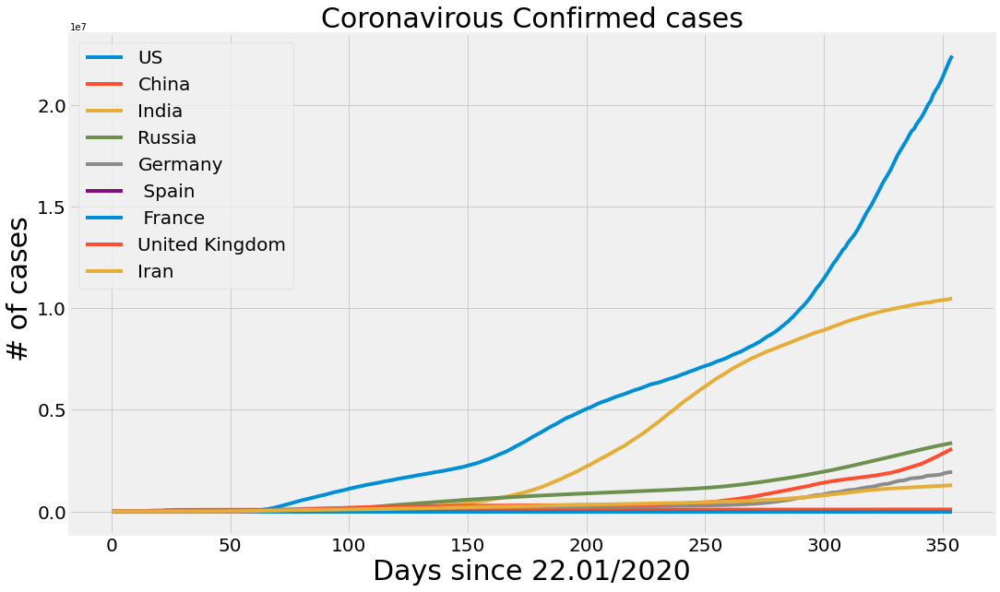

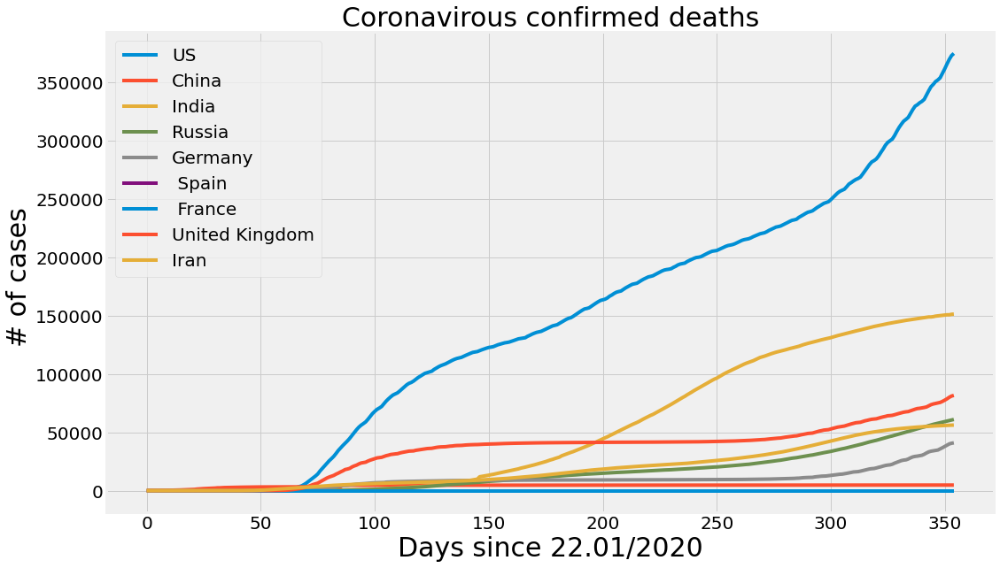

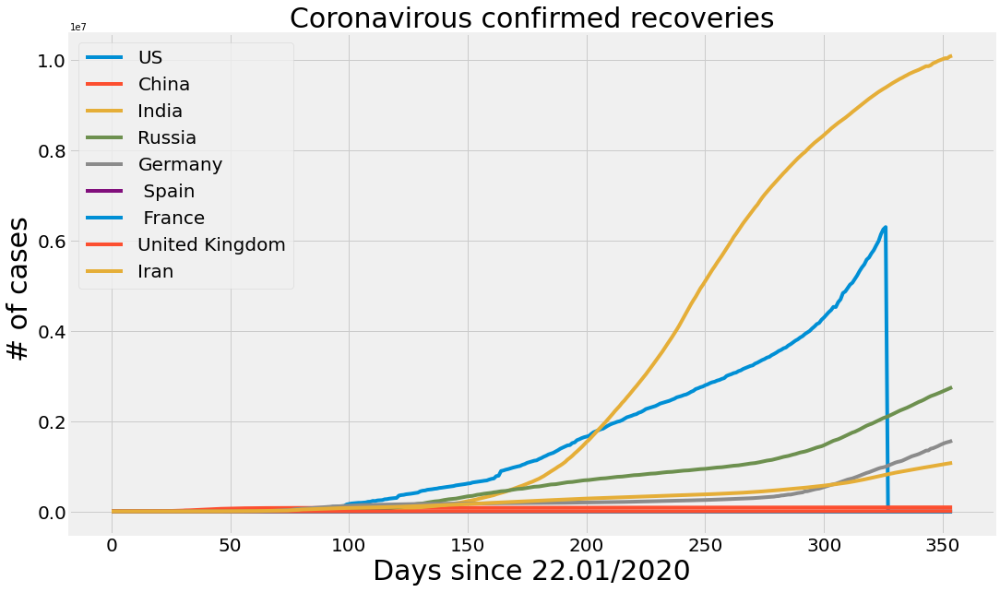

In [41]:
for num in range(3):
    plt.figure(figsize = (16, 10))
    for country in compare_countries:
        plt.plot(get_country_info(country)[num])
    plt.legend(compare_countries , prop = {'size' : 20})
    plt.xlabel('Days since 22.01/2020' , size = 30)
    plt.ylabel('# of cases ' , size = 30)
    plt.title(graph_name[num] , size = 30)
    plt.xticks(size = 20)
    plt.yticks(size = 20)
    
    plt.show()   

# Predictions for confirmed cornavirous case worldwide

In [42]:
def plot_predictions(x,y, pred, algo_name , color):
    plt.figure(figsize = (16,10))
    plt.plot(x,y)
    plt.plot(future_forcast , pred, linestyle = 'dashed' , color = color)
    plt.title('Worldwide Coronavirous Cases over time' , size = 30)
    plt.xlabel('Days since 22/01/2020' , size = 30)
    plt.ylabel('# of cases' , size = 30)
    plt.legend(['Confiremed Cases' , algo_name] , prop = {'size' : 20})
    
    plt.xticks(size = 20)
    plt.yticks(size = 20)
    
    plt.show()

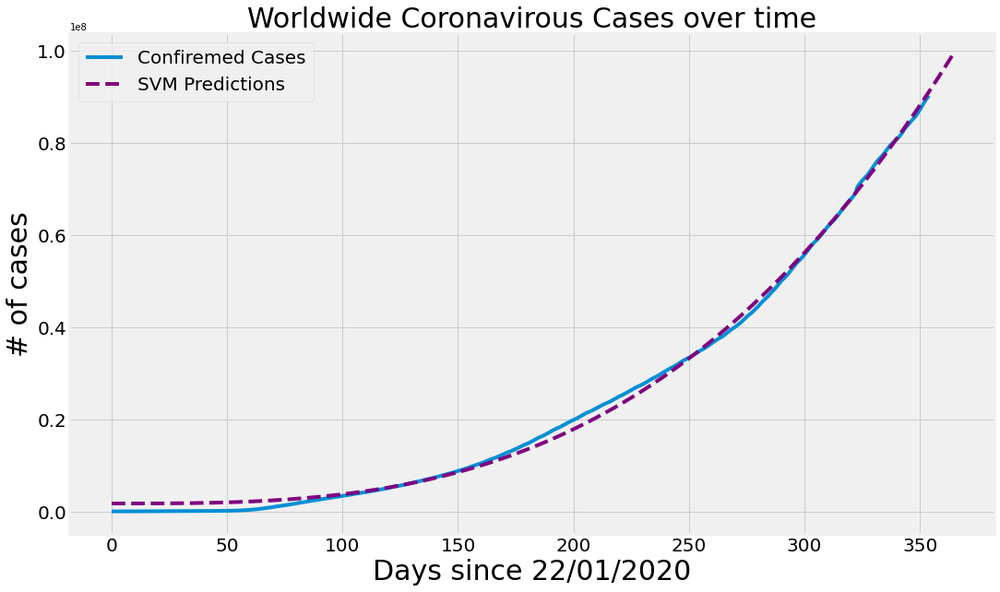

In [43]:
plot_predictions(adjusted_dates , world_cases , svm_pred , 'SVM Predictions' , 'purple')

# Mortality Rate

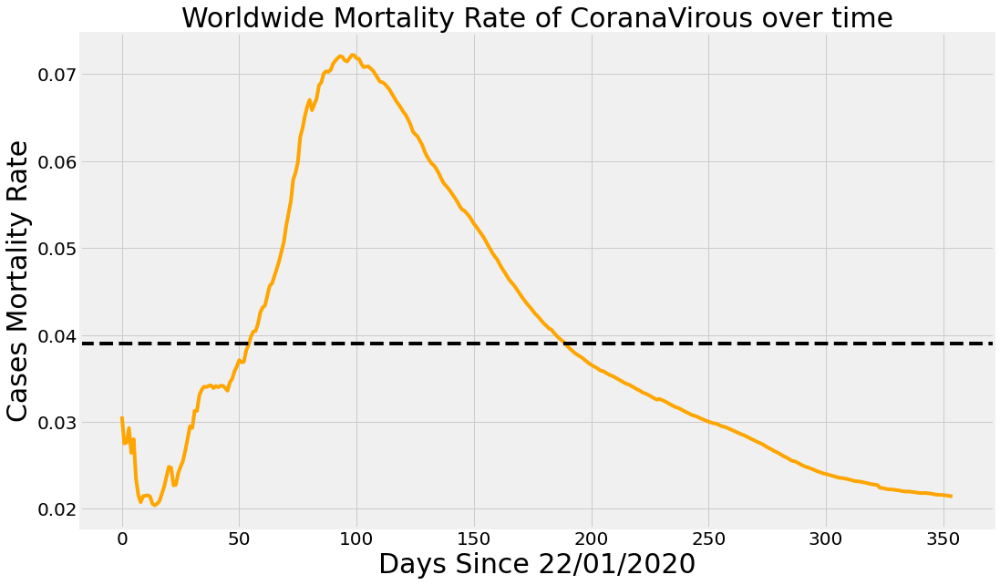

In [44]:
mean_mortality_rate = np.mean(mortality_rate)

plt.figure(figsize = (16,10))
plt.plot( adjusted_dates , mortality_rate , color = 'orange' )
plt.axhline( y = mean_mortality_rate , linestyle = '--' , color = 'black')
plt.title('Worldwide Mortality Rate of CoranaVirous over time' , size = 30)
plt.xlabel('Days Since 22/01/2020' , size = 30)
plt.ylabel('Cases Mortality Rate' , size = 30)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

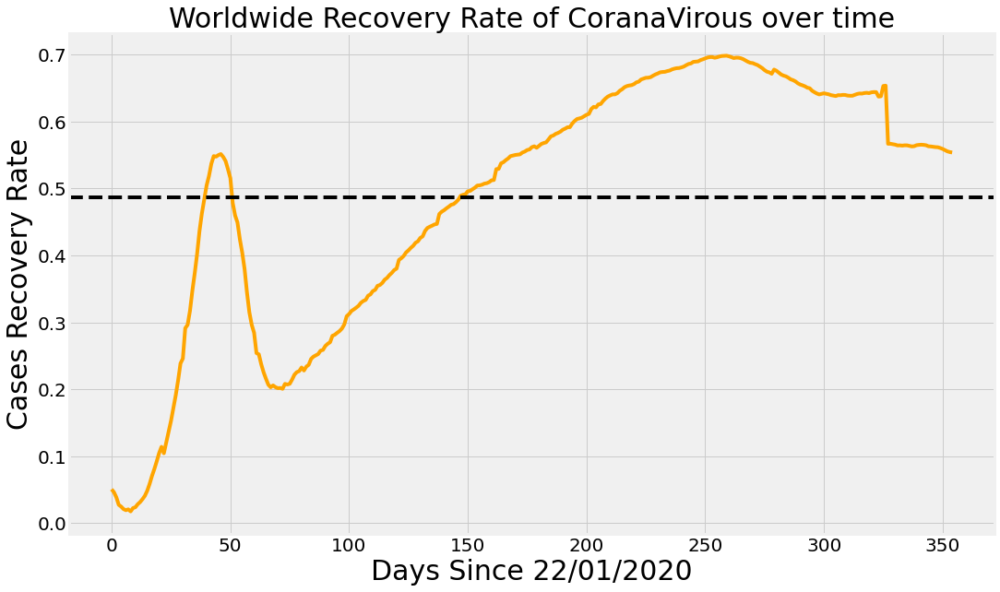

In [45]:
mean_recovery_rate = np.mean(recovery_rate)

plt.figure(figsize = (16,10))
plt.plot( adjusted_dates , recovery_rate , color = 'orange' )
plt.axhline( y = mean_recovery_rate , linestyle = '--' , color = 'black')
plt.title('Worldwide Recovery Rate of CoranaVirous over time' , size = 30)
plt.xlabel('Days Since 22/01/2020' , size = 30)
plt.ylabel('Cases Recovery Rate' , size = 30)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

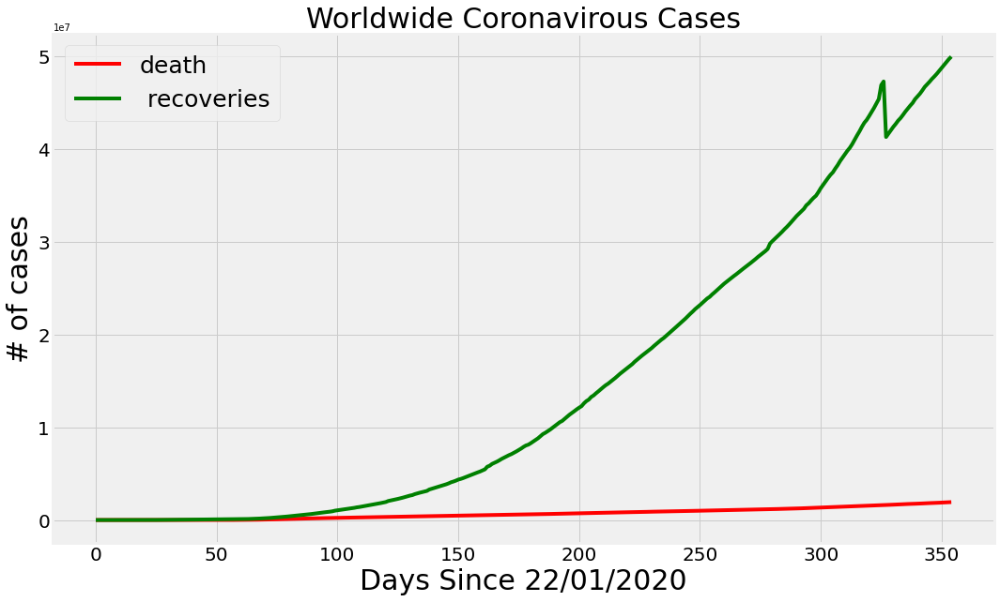

In [46]:
plt.figure(figsize = (16,10))
plt.plot(adjusted_dates , total_deaths, color = 'r')
plt.plot(adjusted_dates, total_recovered , color = 'green')

plt.legend(['death' , ' recoveries'] , loc = 'best' , fontsize = 25)
plt.title('Worldwide Coronavirous Cases', size = 30)
plt.xlabel('Days Since 22/01/2020' , size = 30)
plt.ylabel('# of cases' , size = 30)
plt.xticks(size = 20)
plt.yticks(size = 20)

plt.show()

# Data table

In [47]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2021-01-09 05:22:18,33.93911,67.709953,53332,2257,43440,7635.0,Afghanistan,137.000444,4.231981
1,NaN,NaN,NaN,Albania,2021-01-09 05:22:18,41.15330,20.168300,62378,1230,36971,24177.0,Albania,2167.558552,1.971849
2,NaN,NaN,NaN,Algeria,2021-01-09 05:22:18,28.03390,1.659600,101657,2798,68802,30057.0,Algeria,231.823448,2.752393
3,NaN,NaN,NaN,Andorra,2021-01-09 05:22:18,42.50630,1.521800,8489,84,7724,681.0,Andorra,10986.863392,0.989516
4,NaN,NaN,NaN,Angola,2021-01-09 05:22:18,-11.20270,17.873900,18066,415,12712,4939.0,Angola,54.968212,2.297133


In [48]:
unique_countries =  list(latest_data['Country_Region'].unique())

In [49]:
import operator

In [50]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
country_recovery_cases = []
country_incidence_rate = [] 
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
    country_recovery_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Recovered'].sum())
    country_active_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Active'].sum())
    country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])

In [51]:
country_df = pd.DataFrame({'Country Name' : unique_countries, 'Number of Confirmed Cases' : country_confirmed_cases , 'Number of Deaths' : country_death_cases,
                          'Number of Recoveries' : country_recovery_cases, 'Number of Active Cases' : country_active_cases , 'Incidence Rate' : country_incidence_rate,
                          'Mortality Rate' : country_mortality_rate} )

country_df.style.background_gradient(cmap = 'Oranges')

,Country Name,Number of Confirmed Cases,Number of Deaths,Number of Recoveries,Number of Active Cases,Incidence Rate,Mortality Rate
0,US,21928012,369256,0,21492370.000000,22582537.381346,0.016839
1,India,10413417,150570,10037398,225449.000000,38504.464244,0.014459
2,Brazil,8013708,201460,7136817,675431.000000,131904.392749,0.025139
3,Russia,3321163,60067,2702949,558147.000000,195040.759840,0.018086
4,United Kingdom,2966244,79965,6698,2879581.000000,34059.564397,0.026958
5,France,2804743,67566,207211,2529966.000000,27064.524217,0.024090
6,Turkey,2307581,22450,2182145,102986.000000,2736.076035,0.009729
7,Italy,2237890,77911,1589590,570389.000000,75307.692718,0.034814
8,Spain,2050360,51874,150376,1848110.000000,84217.131225,0.025300
9,Germany,1905638,40022,1533143,332473.000000,34214.926201,0.021002


In [52]:
latest_data.columns

Index(['FIPS', 'Admin2', 'Province_State', 'Country_Region', 'Last_Update',
       'Lat', 'Long_', 'Confirmed', 'Deaths', 'Recovered', 'Active',
       'Combined_Key', 'Incident_Rate', 'Case_Fatality_Ratio'],
      dtype='object')

In [53]:
def country_table(country_name):
    
    states = list(latest_data[latest_data['Country_Region']== country_name]['Province_State'].unique())
    state_confirmed_cases = []
    state_death_cases = []
    state_active = []
    state_incidence_rate = []
    state_mortality_rate = []
    
    no_cases = []
    for i in states : 
        cases = latest_data[latest_data['Province_State'] == i]['Confirmed'].sum()
        if cases> 0 :
            state_confirmed_cases.append(cases)
        else:
            no_cases.append(i)
    
    for i in no_cases:
        states.remove(i)
        
    states = [ k for k,v in sorted(zip(states , state_confirmed_cases), key = operator.itemgetter(1) , reverse = True)]
    for i in range(len(states)):
        state_confirmed_cases[i] = latest_data[latest_data['Province_State'] == states[i]]['Confirmed'].sum()
        state_death_cases.append(latest_data[latest_data['Province_State'] == states[i]]['Deaths'].sum())
        state_active.append(latest_data[latest_data['Province_State'] == states[i]]['Active'].sum())
        state_incidence_rate.append(latest_data[latest_data['Province_State'] == states[i]]['Incident_Rate'].sum())
        state_mortality_rate.append(state_death_cases[i]/state_confirmed_cases[i])
        
    state_df = pd.DataFrame({'State Name' : states , 'Number of Confirmed Cases' : state_confirmed_cases , 'Number of Deaths' : state_death_cases , 
                            'Number of Active Cases' :state_active , ' Incidence Rate' : state_incidence_rate , 'Mortality Rate' : state_mortality_rate })
    
    return state_df  

In [54]:
us_table = country_table('Brazil')
us_table.style.background_gradient(cmap = 'Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Number of Active Cases,Incidence Rate,Mortality Rate
0,Sao Paulo,1528952,48029,140909.000000,3329.668260,0.031413
1,Minas Gerais,579469,12469,46267.000000,2737.374090,0.021518
2,Santa Catarina,515209,5584,19425.000000,7190.847796,0.010838
3,Bahia,508695,9364,6267.000000,3420.243468,0.018408
4,Rio Grande do Sul,474917,9359,15485.000000,4174.272862,0.019707
5,Parana,463309,8629,142470.000000,4052.044275,0.018625
6,Rio de Janeiro,454275,26480,6208.000000,2631.198956,0.058291
7,Ceara,342941,10122,58183.000000,3755.344621,0.029515
8,Goias,316197,6946,4651.000000,4505.287137,0.021967
9,Para,299045,7280,10518.000000,3476.109412,0.024344


# Bar Chart

In [55]:
total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region'] == 'US']['Confirmed'].sum()

outside_us_confirmed = total_world_cases - us_confirmed

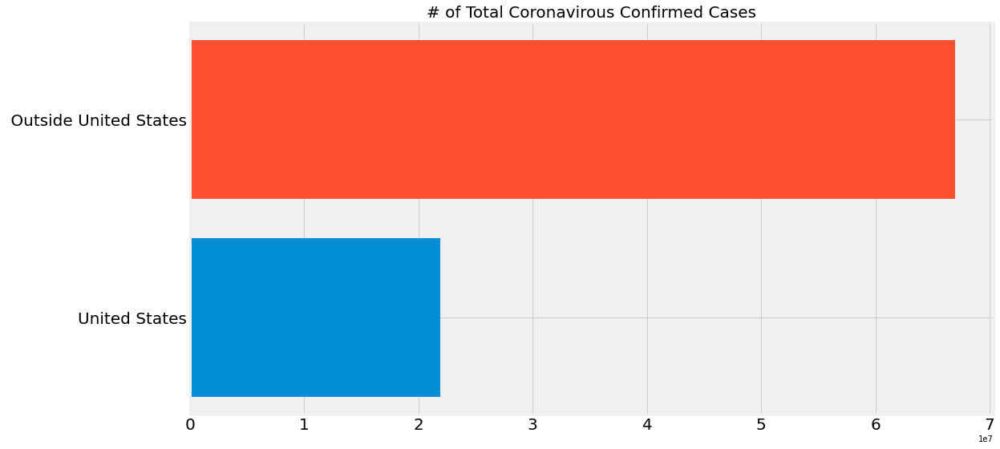

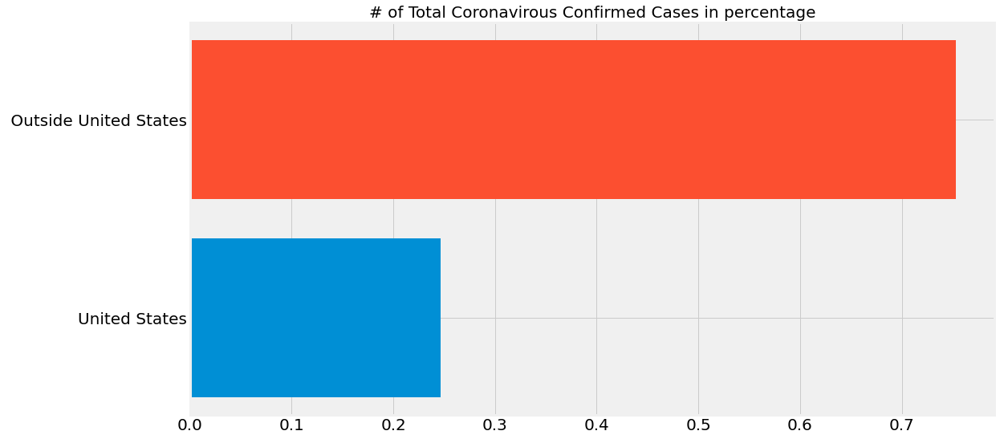

In [56]:
plt.figure (figsize = (16,9))
plt.barh('United States' ,us_confirmed )
plt.barh( ' Outside United States' , outside_us_confirmed )
plt.title('# of Total Coronavirous Confirmed Cases' , size = 20)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

plt.figure (figsize = (16,9))
plt.barh('United States' ,us_confirmed/total_world_cases)
plt.barh( ' Outside United States' , outside_us_confirmed /total_world_cases)
plt.title('# of Total Coronavirous Confirmed Cases in percentage' , size = 20)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.show()

In [57]:
viz_unique_countries = []
viz_confirmed_cases = []

others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
    viz_unique_countries.append(unique_countries[i])
    viz_confirmed_cases.append(country_confirmed_cases[i])
    
viz_unique_countries.append('Others')
viz_confirmed_cases.append(others)



In [58]:
def plot_bar_graphs(x,y,title):
    plt.figure(figsize = (16,12))
    plt.barh(x , y)
    plt.title(title , size = 20)
    plt.xticks(size = 20)
    plt.yticks(size = 20)
    
    plt.show()

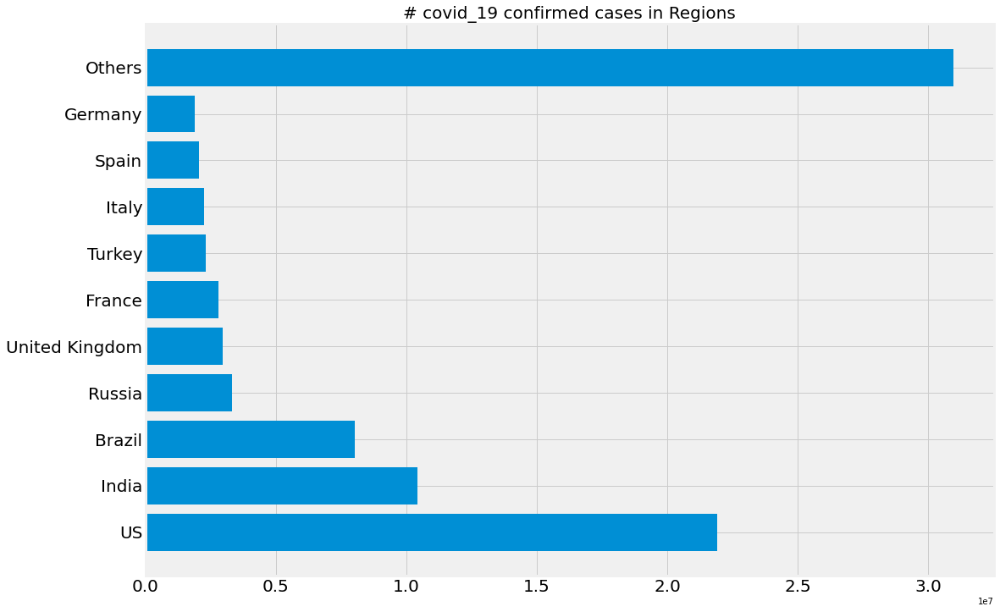

In [59]:
plot_bar_graphs(viz_unique_countries, viz_confirmed_cases , '# covid_19 confirmed cases in Regions' )

# Pie Chart

In [60]:
def plot_pie_chart(x , y , title):
        # more muted color 
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    
    plt.figure(figsize = (20 , 15))
    plt.title(title , size = 20)
    plt.pie(y, colors = c , shadow = True , labels = y)
    plt.legend(x , loc = 'best' , fontsize = '12')
    plt.show()
    

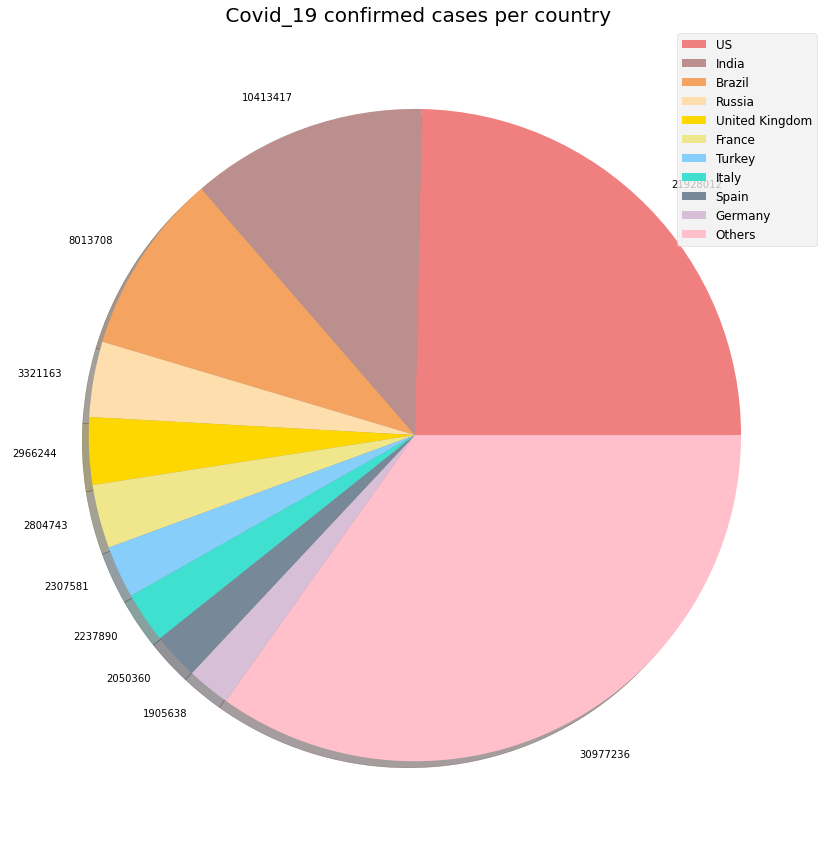

In [61]:
plot_pie_chart(viz_unique_countries , viz_confirmed_cases , ' Covid_19 confirmed cases per country')

In [62]:
def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    
    confirmed_cases = []
    
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)

    # remove areas with no confirmed cases
    for i in no_cases:
        regions.remove(i)

    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]
    
    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']== regions[i]]['Confirmed'].sum()
        
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_chart(regions_5 , confirmed_cases_5 , title )
    else:
        plot_pie_chart(regions,confirmed_cases, title)
        
        

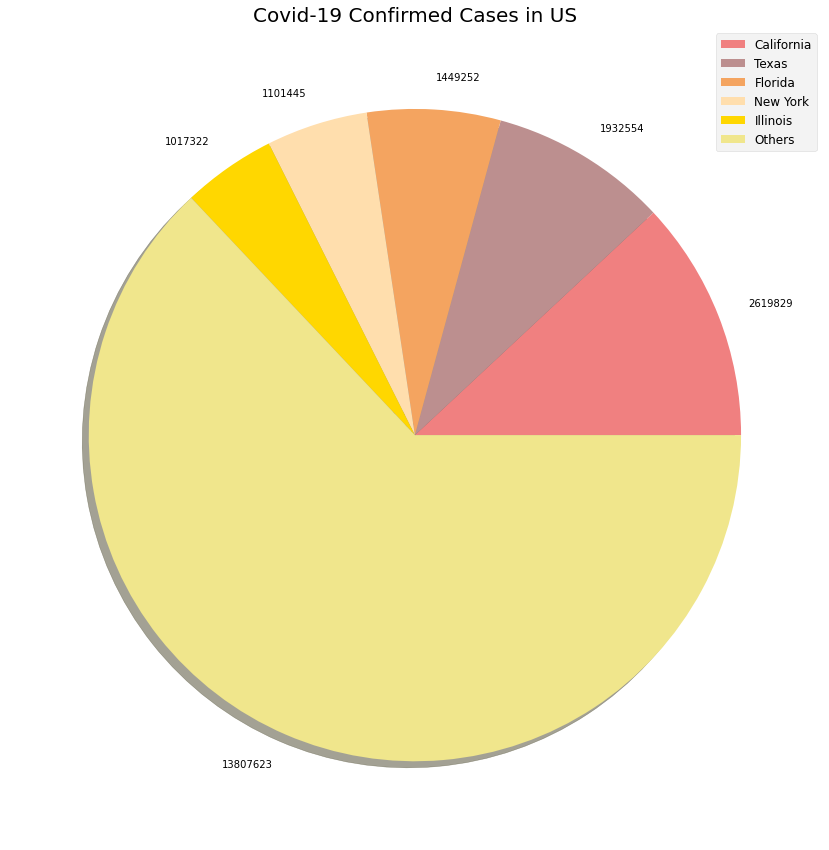

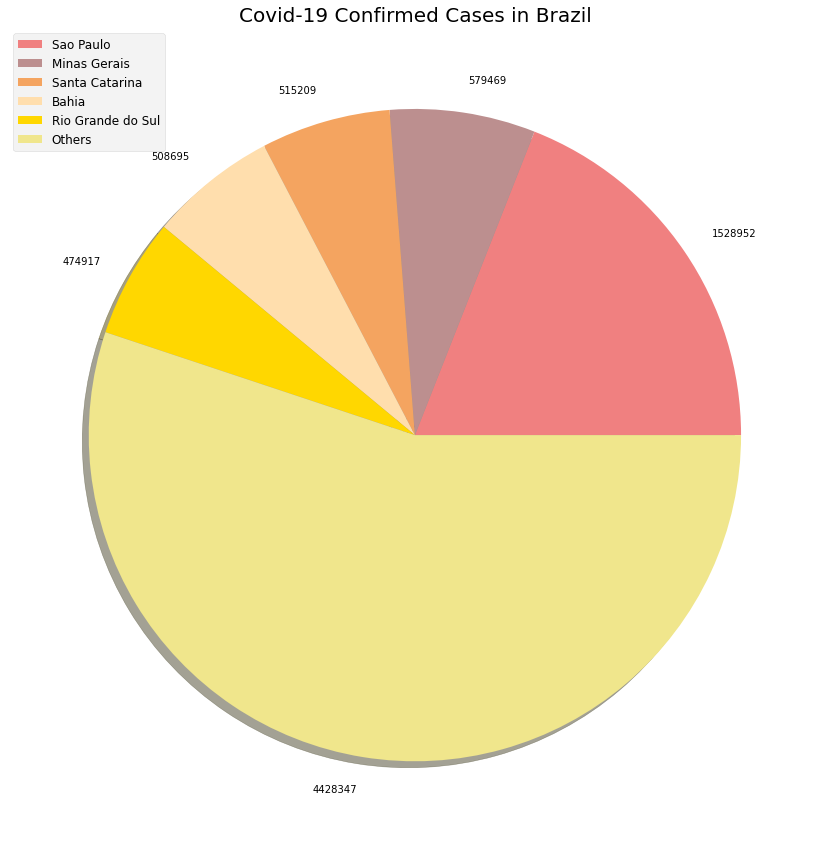

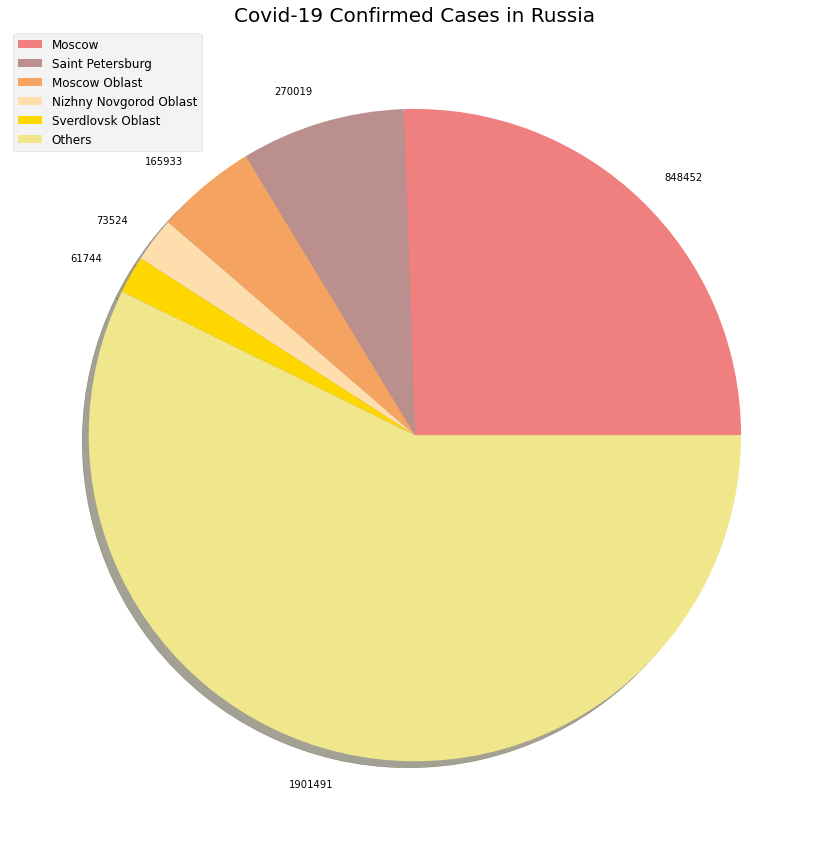

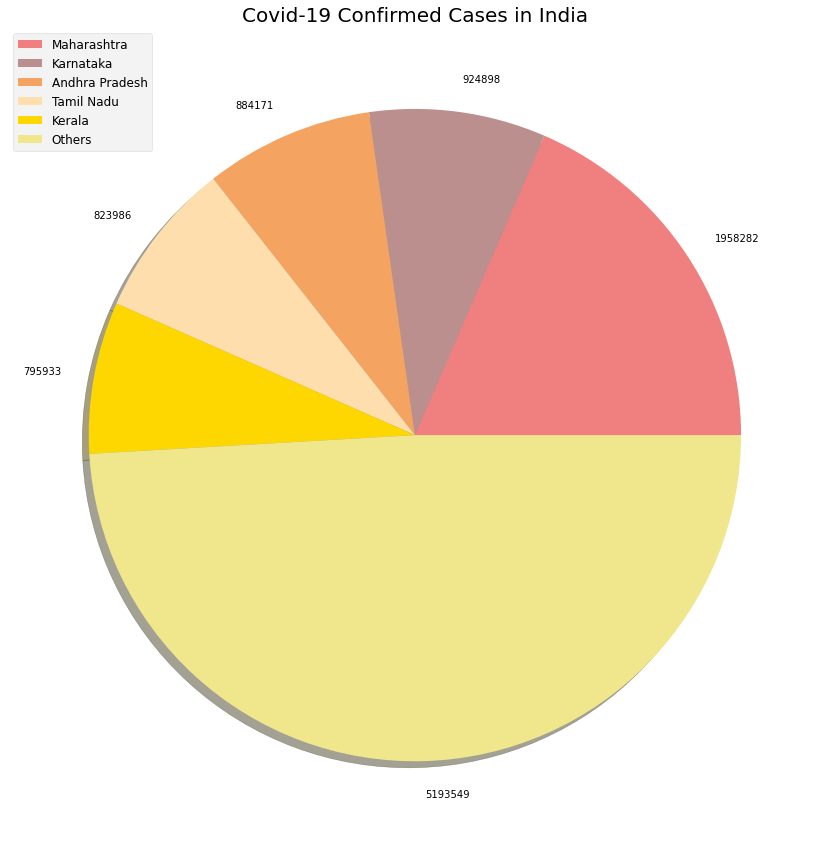

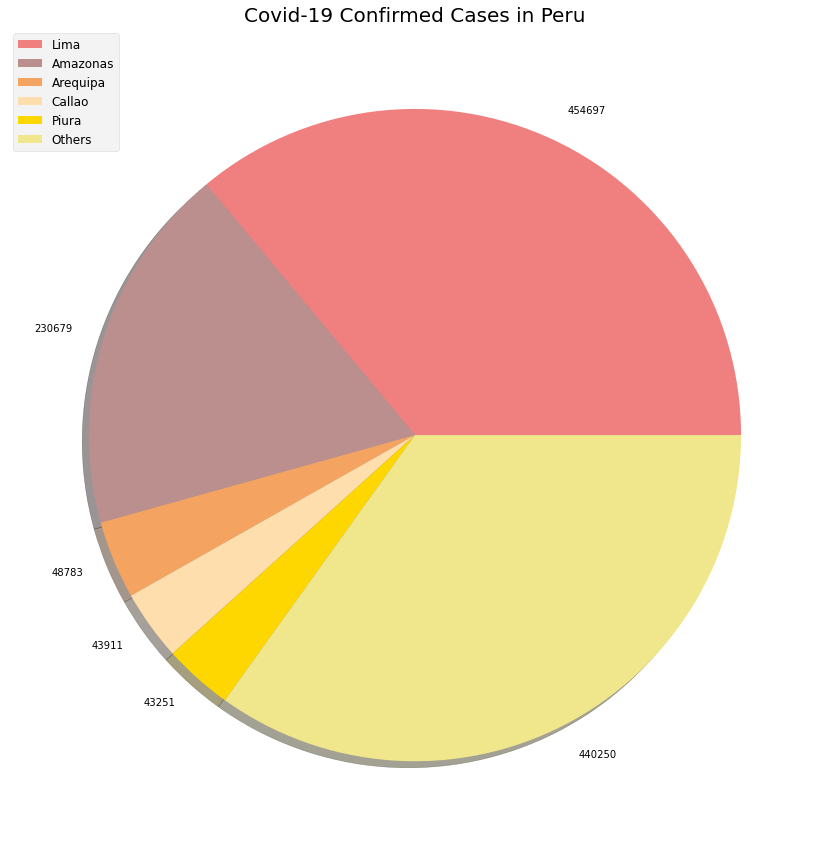

...

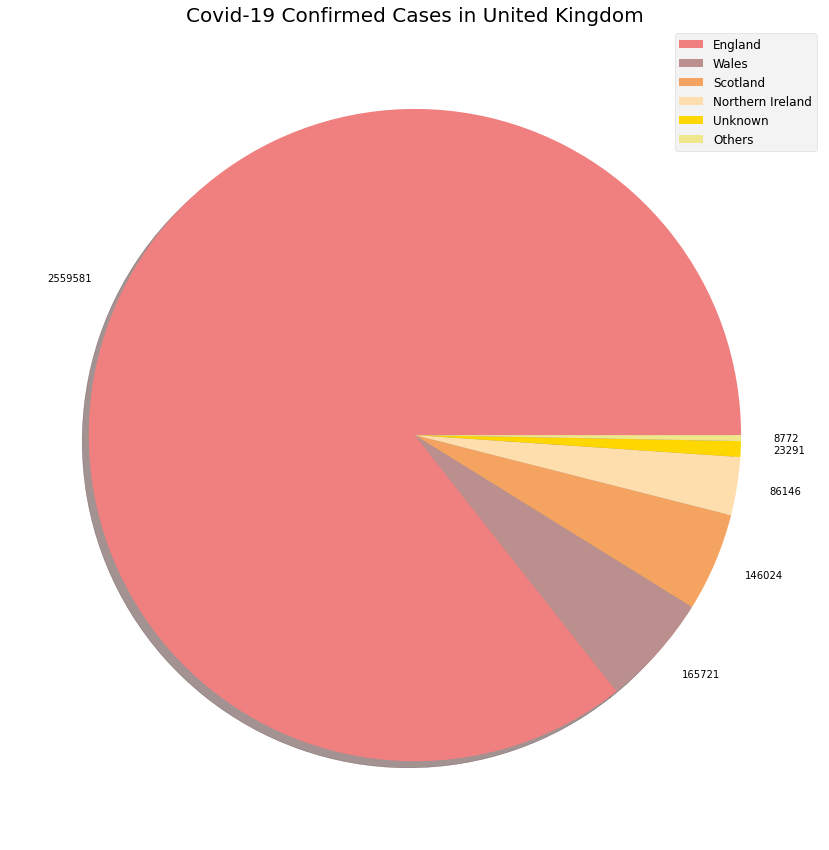

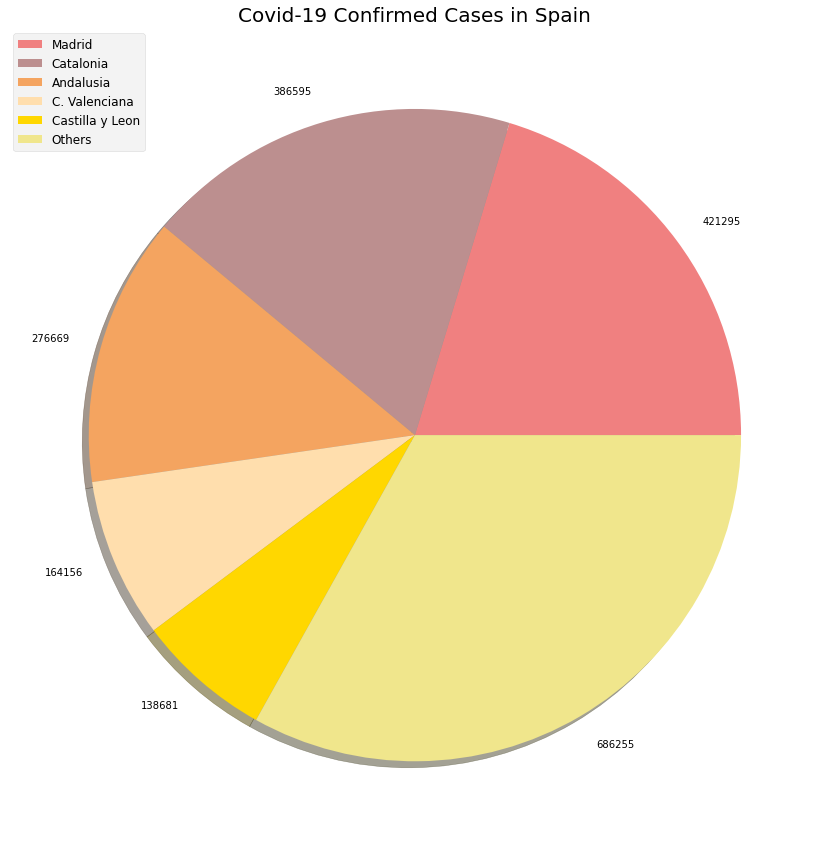

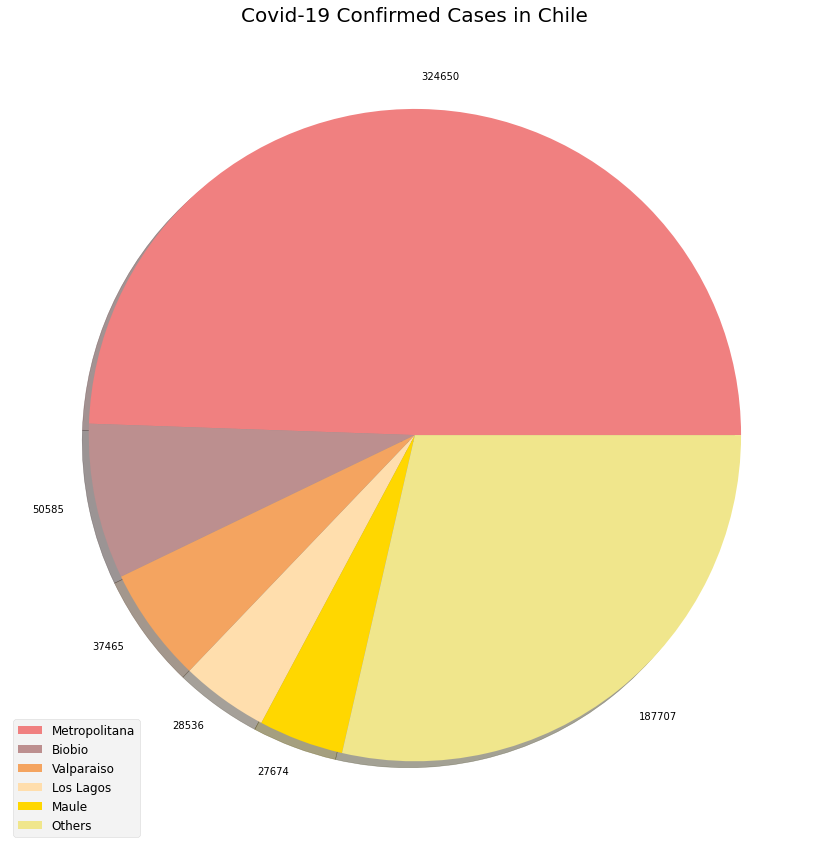

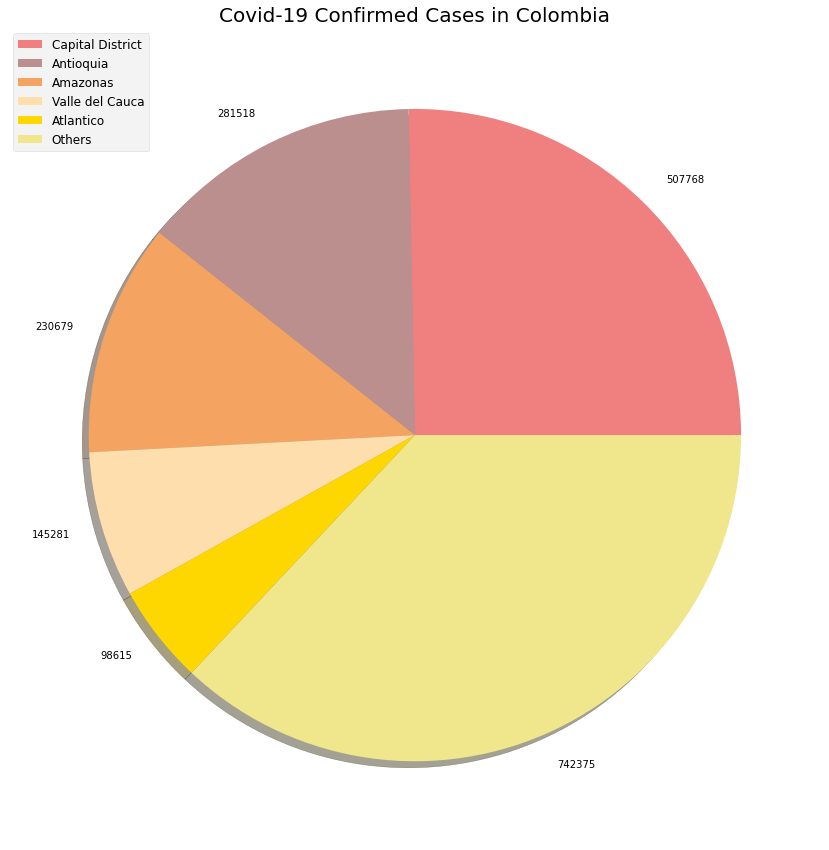

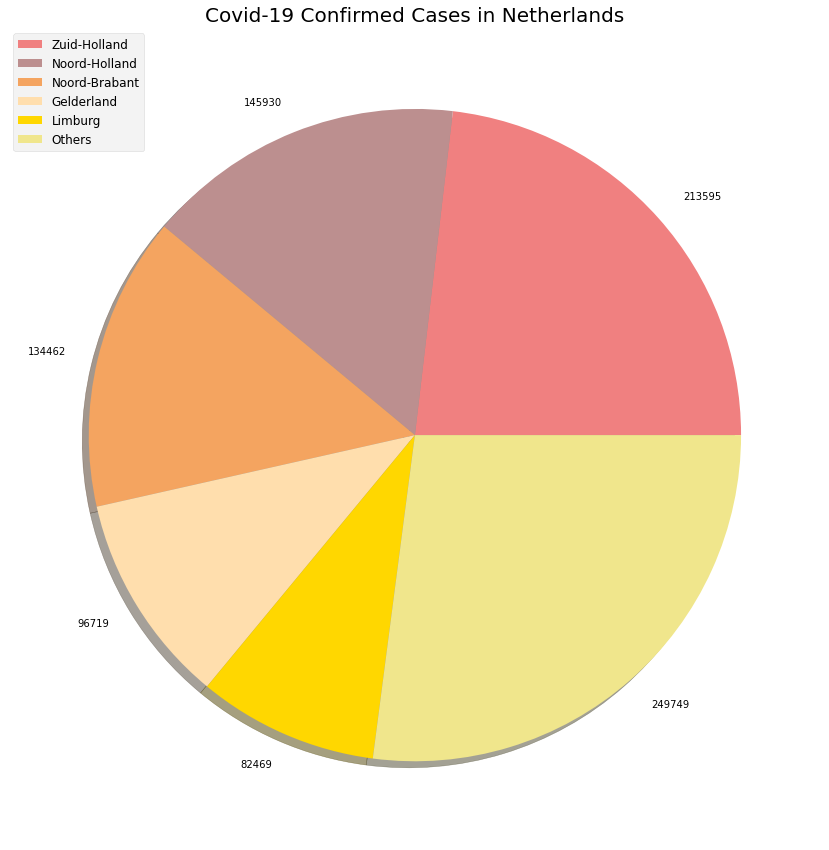

In [63]:
pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'Peru', 'Mexico', 'Canada', 
                       'Australia', 'China', 'Italy', 'Germany', 'France', 'United Kingdom', 'Spain', 'Chile', 'Colombia', 'Netherlands']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i , 'Covid-19 Confirmed Cases in {}'.format(i))

# US Medical Data on Testing

In [64]:
us_medical_data.head()

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,Incident_Rate,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate
0,Alabama,US,2021-01-09 05:30:45,32.3182,-86.9023,394287,5191,211684.0,177412.0,1.0,8041.446529,1944233.0,NaN,1.316554,84000001.0,USA,39652.450397,NaN
1,Alaska,US,2021-01-09 05:30:45,61.3707,-152.4044,49639,223,7165.0,42251.0,2.0,6785.501917,1337749.0,NaN,0.449244,84000002.0,USA,182866.262499,NaN
2,American Samoa,US,2021-01-09 05:30:45,-14.2710,-170.1320,0,0,NaN,0.0,60.0,0.000000,2140.0,NaN,NaN,16.0,ASM,3846.084722,NaN
3,Arizona,US,2021-01-09 05:30:45,33.7298,-111.4312,596251,9938,83095.0,503218.0,4.0,8191.704664,3017154.0,NaN,1.666748,84000004.0,USA,41451.728375,NaN
4,Arkansas,US,2021-01-09 05:30:45,34.9697,-92.3731,248860,3966,217578.0,27316.0,5.0,8246.393735,2142739.0,NaN,1.593667,84000005.0,USA,71003.252696,NaN


In [65]:
us_medical_data.fillna(value = 0 , inplace = True)

In [66]:
def plot_us_medical_data():
    
    states = us_medical_data['Province_State'].unique()
    
    testing_number = []
    testing_rate = []
    
    for i in states:
        testing_number.append(us_medical_data[us_medical_data['Province_State']== i ]['Total_Test_Results'].sum())
        testing_rate.append(us_medical_data[us_medical_data['Province_State']== i ]['Testing_Rate'].max())
        
    testing_states = [k for k,v in sorted(zip(states , testing_number), key = operator.itemgetter(1) , reverse = True)]
    testing_rate_states = [ k for k,v in sorted(zip(states , testing_rate) , key = operator.itemgetter(1), reverse = True)]
    
    for i in range (len(states)):
        testing_number[i] = us_medical_data[us_medical_data['Province_State']== testing_states[i]]['Total_Test_Results'].sum()
        testing_rate[i] = us_medical_data[us_medical_data['Province_State']== testing_rate_states[i]]['Testing_Rate'].sum()
        
    limit = 20
    
    plot_bar_graphs(testing_states[:limit], testing_number[:limit] , 'Total Testing per State - top 20')
    plot_bar_graphs(testing_rate_states[:limit], testing_rate[:limit] , 'Testing rate per 100,000 people - top 20')
        

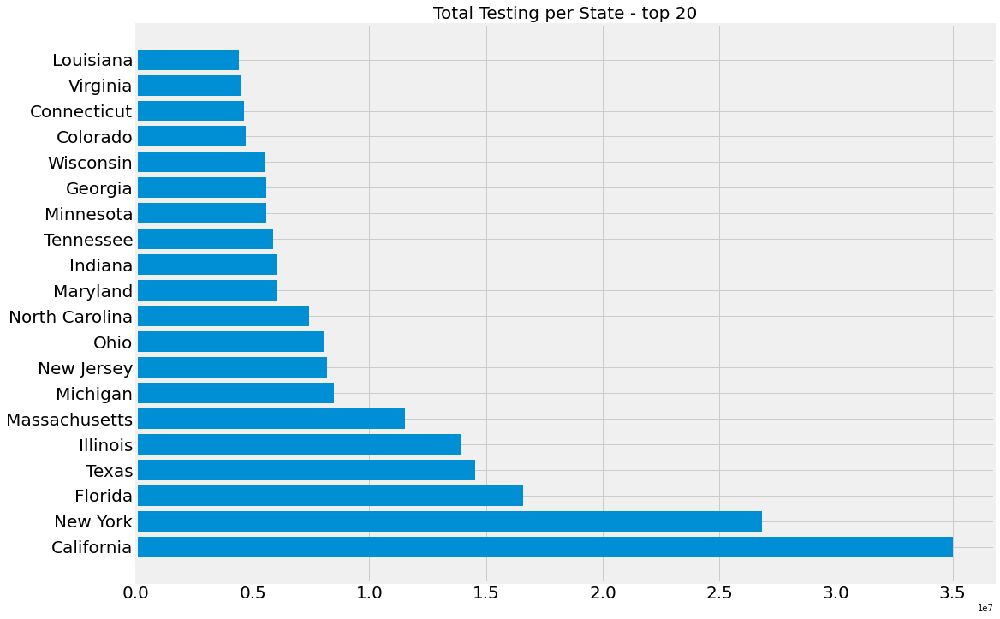

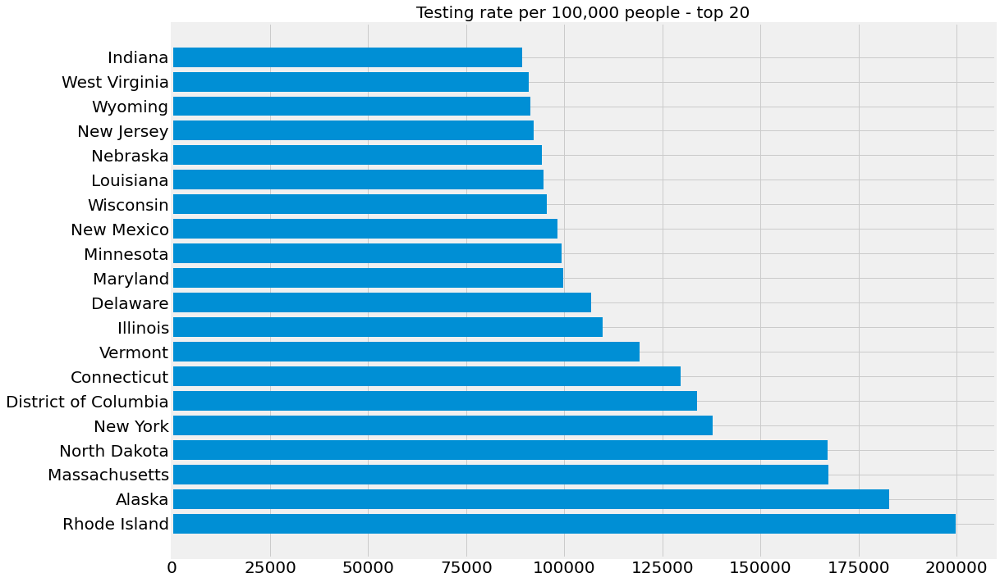

In [67]:
plot_us_medical_data()

# Apple's Mobility Data

In [68]:
apple_mobility.head()

,geo_type,region,transportation_type,alternative_name,sub-region,country,2020-01-13,2020-01-14,2020-01-15,2020-01-16,...,2020-12-30,2020-12-31,2021-01-01,2021-01-02,2021-01-03,2021-01-04,2021-01-05,2021-01-06,2021-01-07,2021-01-08
0,country/region,Albania,driving,NaN,NaN,NaN,100.0,95.30,101.43,97.20,...,134.78,88.13,107.12,172.57,158.94,140.61,138.53,137.04,129.39,134.70
1,country/region,Albania,walking,NaN,NaN,NaN,100.0,100.68,98.93,98.46,...,135.69,83.45,80.38,129.08,132.62,132.92,158.93,150.15,137.06,148.06
2,country/region,Argentina,driving,NaN,NaN,NaN,100.0,97.07,102.45,111.21,...,100.93,107.79,64.89,92.57,75.91,79.00,81.40,82.76,90.53,99.26
3,country/region,Argentina,walking,NaN,NaN,NaN,100.0,95.11,101.37,112.67,...,74.81,67.65,39.87,62.27,47.37,63.03,64.12,67.00,74.14,75.28
4,country/region,Australia,driving,AU,NaN,NaN,100.0,102.98,104.21,108.63,...,96.84,83.52,93.51,87.43,97.74,99.75,103.04,105.38,110.79,99.89


In [69]:
def get_mobility_by_state(transport_type , state , day):
    return apple_mobility[apple_mobility['sub-region'] == state][apple_mobility['transportation_type']==transport_type].sum()[day]

In [70]:
get_mobility_by_state('walking' , 'Florida' , '2020-07-15')

5085.79

In [71]:
dates[0]

'1/22/20'

In [72]:
revised_dates = []
for i in range(len(dates)):
    revised_dates.append(datetime.datetime.strptime(dates[i] , '%m/%d/%y').strftime('%Y-%m-%d'))

In [73]:
revised_dates[0]

'2020-01-22'

In [74]:
def weekday_or_weekend(date):
    date_obj = datetime.datetime.strptime(date , '%Y-%m-%d')
    day_of_the_week = date_obj.weekday()
    if (day_of_the_week+1) % 6 == 0 or (day_of_the_week +1) % 7 ==0 :
        return True
    else:
        return False

In [75]:
revised_day_since_1_22 = [i for i in range(len(revised_dates))]

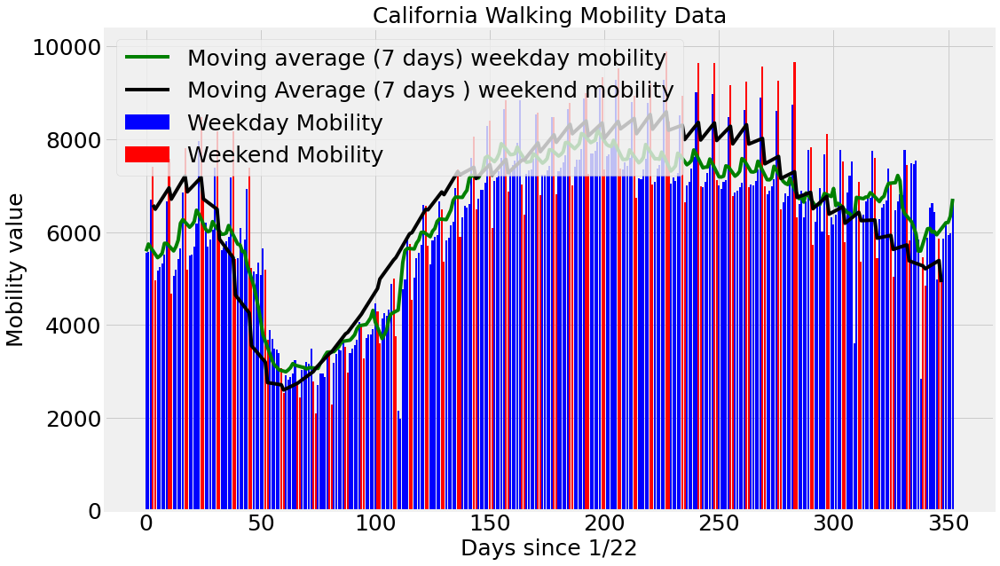

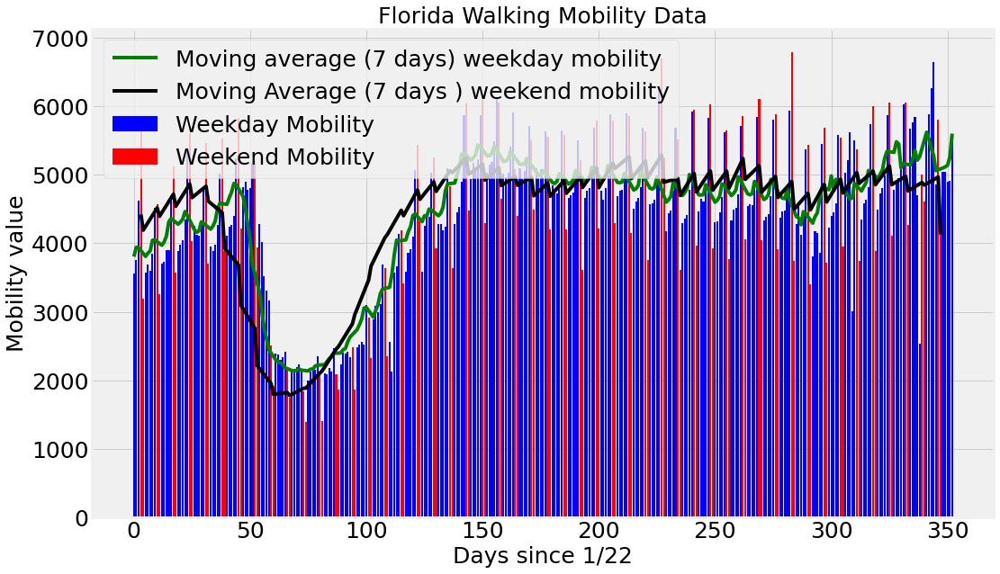

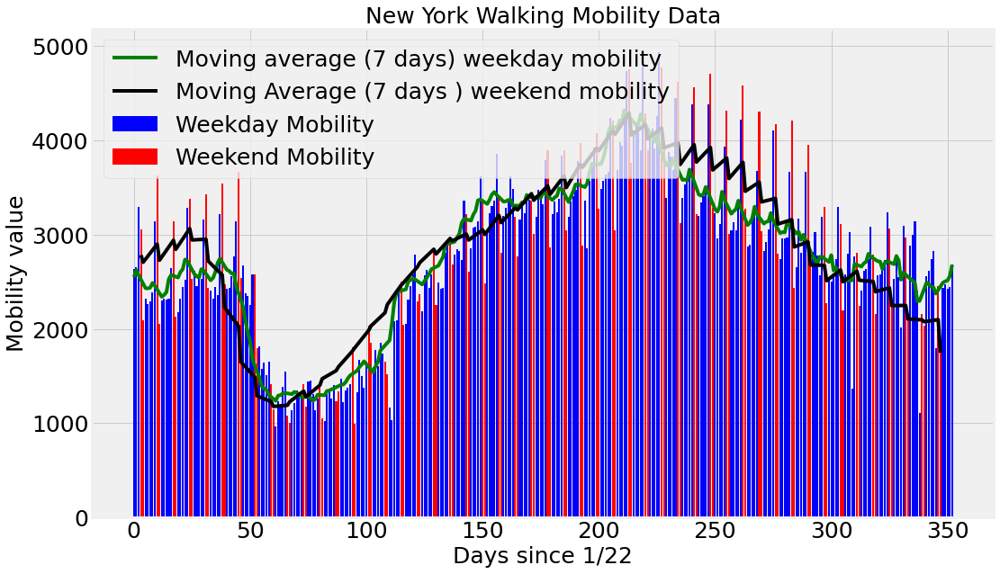

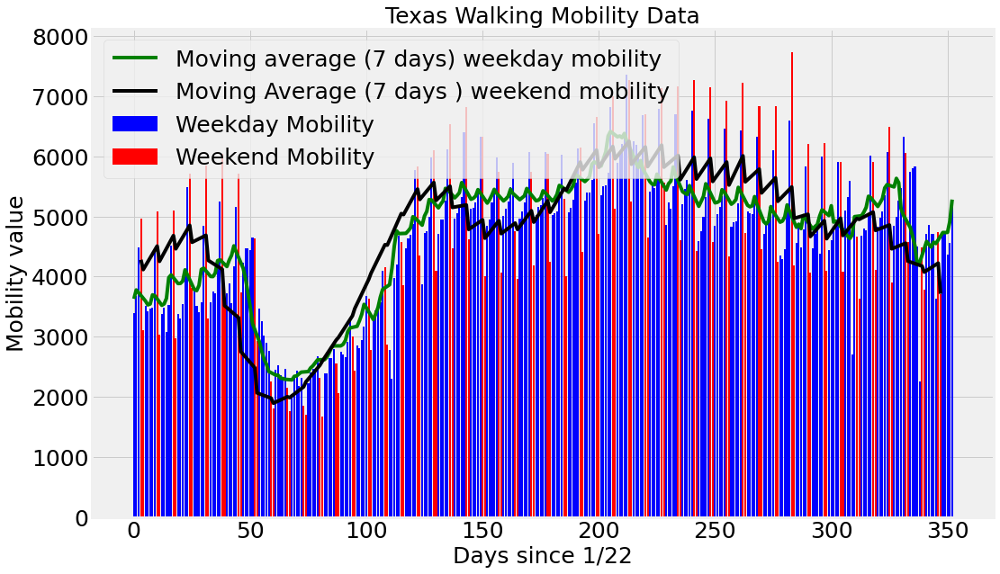

In [76]:
states = ['New York' , 'Florida' , 'California' , 'Texas']
states.sort()

# making sure the dates are in sync 
mobility_latest_date = apple_mobility.columns[-1]
mobility_latest_index = revised_dates.index(mobility_latest_date)

for state in states:
    # weekend and weekday mobility are separated 
    weekday_mobility = []
    weekday_mobility_dates = [] 
    weekend_mobility = [] 
    weekend_mobility_dates = [] 
    
    for i in range(len(revised_dates)):
        if i <= mobility_latest_index:
            if weekday_or_weekend(revised_dates[i]):
                weekend_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
                weekend_mobility_dates.append(i)
            else:
                weekday_mobility.append(get_mobility_by_state('walking', state, revised_dates[i]))
                weekday_mobility_dates.append(i)
        else:
            pass
        
    # remove null values (they are counted as 0)
    for i in range(len(weekend_mobility)):       
        if weekend_mobility[i] == 0 and i != 0:
            weekend_mobility[i] = weekend_mobility[i-1]
        elif weekend_mobility[i] == 0 and i == 0:
            weekend_mobility[i] = weekend_mobility[i+1]
        else:
            pass
        
    for i in range(len(weekday_mobility)):       
        if weekday_mobility[i] == 0 and i != 0:
            weekday_mobility[i] = weekday_mobility[i-1]
        elif weekday_mobility[i] == 0 and i == 0:
            weekday_mobility[i] = weekday_mobility[i+1]
        else:
            pass
        
    
    weekday_mobility_average = moving_average(weekday_mobility, 7)
    weekend_mobility_average = moving_average(weekend_mobility, 7)
     
    plt.figure(figsize=(16, 10))
    
    plt.bar(weekday_mobility_dates, weekday_mobility, color='blue')
    plt.plot(weekday_mobility_dates, weekday_mobility_average, color='green')
    
    plt.bar(weekend_mobility_dates, weekend_mobility, color='red')
    plt.plot(weekend_mobility_dates, weekend_mobility_average, color='black')
    
    plt.legend(['Moving average (7 days) weekday mobility', 'Moving Average (7 days ) weekend mobility', 'Weekday Mobility', 'Weekend Mobility'],
               prop={'size': 25})
    plt.title('{} Walking Mobility Data'.format(state), size=25)
    plt.xlabel('Days since 1/22', size=25)
    plt.ylabel('Mobility value', size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()
    


# Geographical visualization

In [88]:
import plotly.graph_objs as go
import plotly.offline  as pyo

from plotly.offline import download_plotlyjs , init_notebook_mode, plot , iplot

init_notebook_mode(connected = True)
pyo.init_notebook_mode()

In [89]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,1/1/21,1/2/21,1/3/21,1/4/21,1/5/21,1/6/21,1/7/21,1/8/21,1/9/21,1/10/21
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,51526,51526,51526,53011,53105,53105,53207,53332,53400,53489
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,58316,58991,59438,59623,60283,61008,61705,62378,63033,63595
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,99897,100159,100408,100645,100873,101120,101382,101657,101913,102144
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,8117,8166,8192,8249,8308,8348,8348,8489,8586,8586
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,17568,17608,17642,17684,17756,17864,17974,18066,18156,18193


In [90]:
df_countries = confirmed_df.iloc[:,[1,-1]]
df_countries.columns = ['country' , 'confirmed']
df_countries.head()


,country,confirmed
0,Afghanistan,53489
1,Albania,63595
2,Algeria,102144
3,Andorra,8586
4,Angola,18193


In [91]:
df_countries = df_countries.drop_duplicates(subset=['country'])
df_countries = df_countries[df_countries['confirmed']>0]

In [93]:
fig = go.Figure(data = go.Choropleth(
    locations = df_countries['country'],
    locationmode = 'country names',
    z = df_countries['confirmed'],
    colorscale = 'reds',
    marker_line_color = 'black',
    marker_line_width = 0.5,
))       

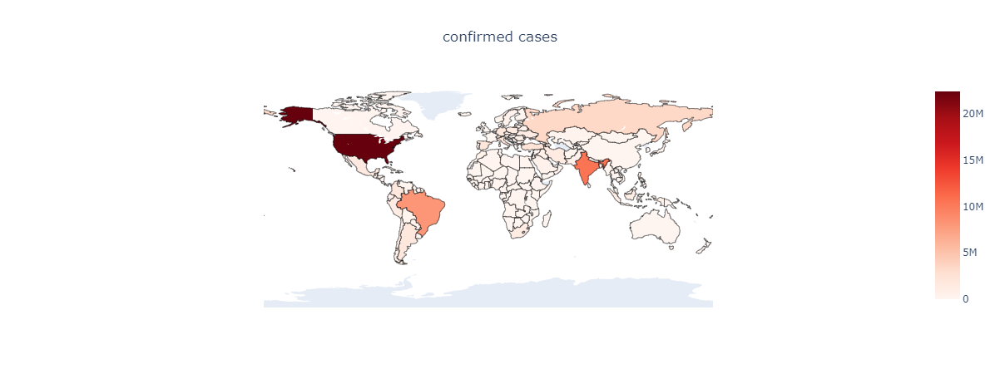

In [95]:
fig.update_layout(
    title_text = 'confirmed cases ',
    title_x = 0.5,
    geo = dict(
            showframe = False,
            showcoastlines = False,
            projection_type = 'equirectangular'
    )
)